## Replicating the results of thesis(Radon data) on new dataset
- new datasetset has attribute named gravity(lower) this attribute we will consider dependent variable to our model and Barometric pressure, theoriotical_tides as independent variable to the model
- plot the result, calculate the accuracy, plot the anomaly detection results, also try method called isolation forest for anomaly detection in the data
### Models to use:

**Supervised algo:**

1.   SVR radial kernel
2.   KNN
3.  Random Forest
4.  XGBoost

**Unsupervised algo:**
1. Isolation Forest
2. K-means time series clustering

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.svm import LinearSVR
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from xgboost import XGBRegressor
import joblib
from scipy import stats
import os

In [4]:
# loading the dataset
gravity_df = pd.read_excel("/home/raghav/Raghav/Personal/Gravity_data_experiment/Minutes_data-1.xlsx")
seismic_selected_events_df = pd.read_csv("/home/raghav/Raghav/Personal/Gravity_data_experiment/2012_seismic_events_more_than_3.5.csv")
gravity_df.head()

,years,months,days,hours,minutes,Gravity_lower(ngals),Gravity_Upper(ngals),Barometric_pressure,Theriotical_tides
0,2012,1,10,0,1,-4520.500041,-3710.496912,998.090860,239.872880
1,2012,1,10,0,2,-4509.155824,-3702.142606,998.078372,249.694202
2,2012,1,10,0,3,-4497.826560,-3693.864818,998.066033,259.469495
3,2012,1,10,0,4,-4486.513461,-3685.663547,998.053843,269.198162
4,2012,1,10,0,5,-4475.217737,-3677.538794,998.041802,278.879614


In [5]:
gravity_df['date'] = pd.to_datetime(gravity_df[['years','months','days']])#Convert the given date into datetime format.
gravity_df['date_with_time'] = pd.to_datetime(gravity_df[['years','months','days', 'hours', 'minutes']])#Adding the time to the date.
seismic_selected_events_df.rename(columns={"Min":"Minute", "Sec":"Second"}, inplace=True)#Renaming the existing Columns.
seismic_selected_events_df['date'] = pd.to_datetime(seismic_selected_events_df[['Year','Month','Day']])#This is the seismic event dataframe used for testing purpose.
seismic_selected_events_df['date_with_time_with_sec'] = pd.to_datetime(seismic_selected_events_df[['Year','Month','Day', 'Hour', 'Minute', 'Second']])
# gravity_df.rename(columns={"years":"Year", "months":"Month", "days":"Day"}, inplace = True)
seismic_selected_events_df['label'] = 'SA'
seismic_selected_events_df.head()

,Year,Month,Day,Hour,Minute,Second,Lat,Long,Distance,Magnitude,date,date_with_time_with_sec,label
0,2012,3,26,5,32,54.6,23.452,70.388,18.4,3.5,2012-03-26,2012-03-26 05:32:54.600,SA
1,2012,4,14,3,22,59.1,23.391,70.537,18.9,4.1,2012-04-14,2012-04-14 03:22:59.100,SA
2,2012,5,7,11,25,31.4,23.409,70.352,31.4,3.7,2012-05-07,2012-05-07 11:25:31.400,SA
3,2012,5,13,20,47,30.2,23.409,70.170,29.8,3.5,2012-05-13,2012-05-13 20:47:30.200,SA
4,2012,5,23,23,55,49.5,23.562,70.410,20.8,3.7,2012-05-23,2012-05-23 23:55:49.500,SA


In [6]:
gravity_df.head()

,years,months,days,hours,minutes,Gravity_lower(ngals),Gravity_Upper(ngals),Barometric_pressure,Theriotical_tides,date,date_with_time
0,2012,1,10,0,1,-4520.500041,-3710.496912,998.090860,239.872880,2012-01-10,2012-01-10 00:01:00
1,2012,1,10,0,2,-4509.155824,-3702.142606,998.078372,249.694202,2012-01-10,2012-01-10 00:02:00
2,2012,1,10,0,3,-4497.826560,-3693.864818,998.066033,259.469495,2012-01-10,2012-01-10 00:03:00
3,2012,1,10,0,4,-4486.513461,-3685.663547,998.053843,269.198162,2012-01-10,2012-01-10 00:04:00
4,2012,1,10,0,5,-4475.217737,-3677.538794,998.041802,278.879614,2012-01-10,2012-01-10 00:05:00


In [7]:
labelled_df = pd.merge(seismic_selected_events_df, gravity_df, on=['date'], how='right')#Merge the seismic event dataframe with the gravity dataframe on basis of time.#Performing Right Join operation on the two Dataframes.
labelled_df['label'] = labelled_df['label'].fillna('NSA')#Full out the remaning row values for the given column to NSA(Non-Seismic Activity).
labelled_df = labelled_df[gravity_df.columns.tolist()+['label']]#gravity_df.columns.tolist()Gets the list of common columns between the two dataframes and then appends the label column to it.

In [8]:
def get_windowed_df(df, date_list, per_day_samples, window_size=1):
    for d in date_list:
        idx_list = df[df['date'] == d].index
        first_idx = idx_list[0]#First index of the given date.
        last_idx = idx_list[-1]#Last index of the given date.

        new_first_idx = max(first_idx - (per_day_samples*window_size), 0)
        new_last_idx = min(last_idx + (per_day_samples*window_size), len(df)) #+1 because we are doing slicing operation

        if df.iloc[first_idx]['label']=='SA' and df.iloc[last_idx]['label']=='SA':
            # print("last:",new_last_idx)
            df.loc[new_first_idx:new_last_idx,'label'] = "SA"
        else:
            print("something wrong in index calculation")
    return df

labelled_W1_df = get_windowed_df(labelled_df.copy(), seismic_selected_events_df.date.tolist(), per_day_samples=1440, window_size=1)#taking a window of +- 1 day.
labelled_W3_df = get_windowed_df(labelled_df.copy(), seismic_selected_events_df.date.tolist(), per_day_samples=1440, window_size=3)#taking a window of +- 3 day.

In [9]:
# labelled_W1_df.to_csv("labelled_W1_df.csv")
# labelled_W3_df.to_csv("labelled_W3_df.csv")

In [10]:
# labelled_W1_df[labelled_W1_df['label'] == 'SA']['date'].unique().tolist()

In [11]:
labelled_W1_df.head()

,years,months,days,hours,minutes,Gravity_lower(ngals),Gravity_Upper(ngals),Barometric_pressure,Theriotical_tides,date,date_with_time,label
0,2012,1,10,0,1,-4520.500041,-3710.496912,998.090860,239.872880,2012-01-10,2012-01-10 00:01:00,NSA
1,2012,1,10,0,2,-4509.155824,-3702.142606,998.078372,249.694202,2012-01-10,2012-01-10 00:02:00,NSA
2,2012,1,10,0,3,-4497.826560,-3693.864818,998.066033,259.469495,2012-01-10,2012-01-10 00:03:00,NSA
3,2012,1,10,0,4,-4486.513461,-3685.663547,998.053843,269.198162,2012-01-10,2012-01-10 00:04:00,NSA
4,2012,1,10,0,5,-4475.217737,-3677.538794,998.041802,278.879614,2012-01-10,2012-01-10 00:05:00,NSA


In [14]:
def RMSE(actual, pred):
    squared_diff = np.square((actual-pred))
    return np.sqrt(np.mean(squared_diff))

def MSE(actual, pred):
    squared_diff = np.square((actual-pred))
    return np.mean(squared_diff)

def RMSLE(actual, pred):
    LOG_e = np.square(np.log(actual+1)-np.log(pred+1))
    return np.sqrt(np.mean(LOG_e))

def MAPE(actual, pred):
    abs_ratio = np.abs(actual-pred)/np.abs(actual)
    return np.mean(abs_ratio)

def percentage_bias(actual, pred):
    diff = np.sum(pred-actual)
    sum_act = np.sum(actual)
    ratio = np.divide(diff, sum_act)
    return 100*ratio

def get_performance(y_true, y_pred):
    print("RMSE value: ",RMSE(y_true, y_pred))
    print("RMSLE value: ",RMSLE(y_true, y_pred))
    print("MAPE value: ",MAPE(y_true, y_pred))
    print("percentage bias: ",percentage_bias(y_true, y_pred))

def train_test_data_split(df):
    Xy_train = df[df['label'] == 'NSA'][['date', 'date_with_time', 'Barometric_pressure', 'Theriotical_tides', 'Gravity_lower(ngals)']]
    X_train = Xy_train[['Barometric_pressure', 'Theriotical_tides']]
    y_train = Xy_train['Gravity_lower(ngals)']

    Xy_test = df[df['label'] == 'SA'][['date', 'date_with_time', 'Barometric_pressure', 'Theriotical_tides', 'Gravity_lower(ngals)']]
    X_test = Xy_test[['Barometric_pressure', 'Theriotical_tides']]
    y_test = Xy_test['Gravity_lower(ngals)']
    test_sample_dates = Xy_test['date']
    test_sample_dates_with_time = Xy_test['date_with_time']
    return X_train, X_test, y_train, y_test, test_sample_dates, test_sample_dates_with_time

def prediction_plot(y_true, y_pred, dates, model_name, w_size, per_day_samples = 1440):
    plt.figure(figsize = (40,20))
    plt.plot(np.array(y_true), color='red')
    plt.plot(np.array(y_pred), color='black')
    plt.xticks([i for i in range(0, len(dates.values), per_day_samples)], dates.dt.strftime('%Y-%m-%d').values[::per_day_samples], rotation=45, fontsize=30)

    # # Label rotation for better readability, adjust as needed
    # plt.xticks(rotation=45)

    plt.yticks(fontsize=30)
    plt.xlabel("Date", fontsize=30)
    plt.ylabel("Gravity_lower(ngals)", fontsize=30)
    plt.legend(['actual Gravity_lower(ngals)', 'Predicted Gravity_lower(ngals)'], fontsize=30)
    plt.title("{} Model Predictions on window of size {}".format(model_name, w_size))
    plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/model_output_plots/{model_name}_Window_{w_size}.pdf", format='pdf')
    plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/model_output_plots/{model_name}_Window_{w_size}.eps", format='eps')
    plt.show()

In [13]:
X_train_W1, X_test_W1, y_train_W1, y_test_W1, test_sample_dates_W1, test_sample_dates_time_W1 = train_test_data_split(labelled_W1_df)
X_train_W3, X_test_W3, y_train_W3, y_test_W3, test_sample_dates_W3, test_sample_dates_time_W3 = train_test_data_split(labelled_W3_df)

In [ ]:
# gravity_df[gravity_df['date'] == '2012-06-19'][gravity_df['hours'].isin([19,20,21])][gravity_df['Gravity_lower(ngals)']>0]

## KNN

In [90]:
test_sample_dates_W1

107999   2012-03-25
108000   2012-03-25
108001   2012-03-25
108002   2012-03-25
108003   2012-03-25
            ...    
262074   2012-07-09
262075   2012-07-09
262076   2012-07-09
262077   2012-07-09
262078   2012-07-09
Name: date, Length: 34560, dtype: datetime64[ns]

In [34]:
test_sample_dates_time_W1

107999   2012-03-25 00:00:00
108000   2012-03-25 00:01:00
108001   2012-03-25 00:02:00
108002   2012-03-25 00:03:00
108003   2012-03-25 00:04:00
                 ...        
262074   2012-07-09 23:55:00
262075   2012-07-09 23:56:00
262076   2012-07-09 23:57:00
262077   2012-07-09 23:58:00
262078   2012-07-09 23:59:00
Name: date_with_time, Length: 34560, dtype: datetime64[ns]

In [91]:
y_test_W1[:1440]

107999   -4930.800696
108000   -4927.136782
108001   -4919.698114
108002   -4915.679597
108003   -4911.433108
             ...     
109434   -5079.850193
109435   -5178.331011
109436   -5582.727919
109437   -4858.056996
109438   -4670.369957
Name: Gravity_lower(ngals), Length: 1440, dtype: float64

In [92]:
seismic_selected_events_df

,Year,Month,Day,Hour,Min,Sec,Lat,Long,Distance,Magnitude,date,label
0,2012,3,26,5,32,54.6,23.452,70.388,18.4,3.5,2012-03-26,SA
1,2012,4,14,3,22,59.1,23.391,70.537,18.9,4.1,2012-04-14,SA
2,2012,5,7,11,25,31.4,23.409,70.352,31.4,3.7,2012-05-07,SA
3,2012,5,13,20,47,30.2,23.409,70.170,29.8,3.5,2012-05-13,SA
4,2012,5,23,23,55,49.5,23.562,70.410,20.8,3.7,2012-05-23,SA
5,2012,5,30,9,23,38.5,23.394,70.043,18.5,3.5,2012-05-30,SA
6,2012,6,19,20,14,0.4,23.645,70.283,11.1,5.3,2012-06-19,SA
7,2012,7,8,8,58,25.4,23.632,70.283,10.7,3.5,2012-07-08,SA


/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(


RMSE value:  305.31810129555004
RMSLE value:  nan
MAPE value:  0.04004849277609125
percentage bias:  -0.5112943511587501


/home/raghav/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_1010941/1782918297.py:6: RuntimeWarning: invalid value encountered in log
  LOG_e = np.square(np.log(actual+1)-np.log(pred+1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


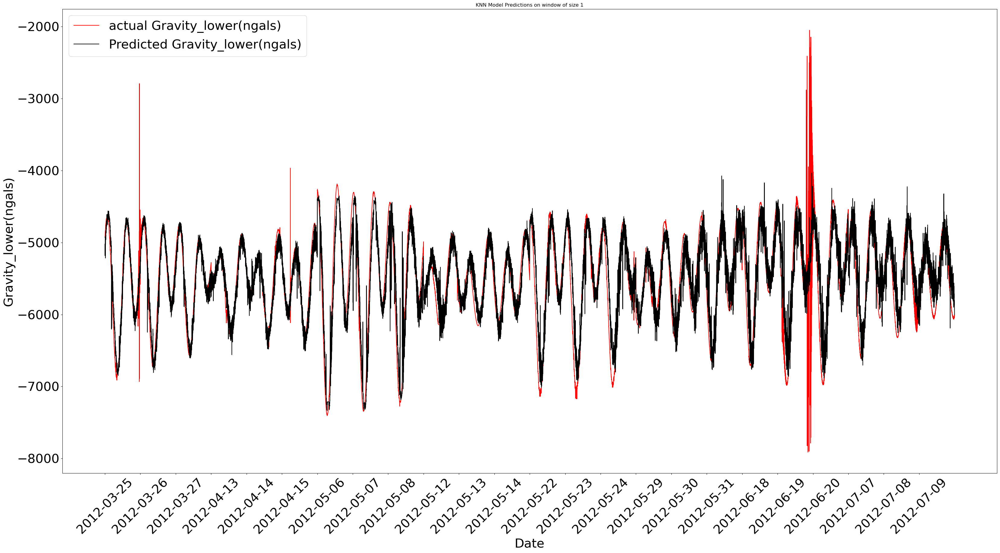

In [93]:
knn_W1 = KNeighborsRegressor(n_neighbors = 15, weights='distance', n_jobs = -1)
# apply_model_10by10CV(X_train_S1W1, X_test_S1W1, y_train_S1W1, y_test_S1W1, knn_S1W1)
knn_W1.fit(X_train_W1, y_train_W1)

y_pred_knn_W1 = knn_W1.predict(np.array(X_test_W1))

get_performance(y_test_W1.astype(float), y_pred_knn_W1.astype(float))
prediction_plot(y_test_W1, y_pred_knn_W1, test_sample_dates_W1, "KNN", 1)

/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(


RMSE value:  309.97183213045975
RMSLE value:  nan
MAPE value:  0.042003195818860084
percentage bias:  -0.757615588407572


/home/raghav/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_1010941/1782918297.py:6: RuntimeWarning: invalid value encountered in log
  LOG_e = np.square(np.log(actual+1)-np.log(pred+1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


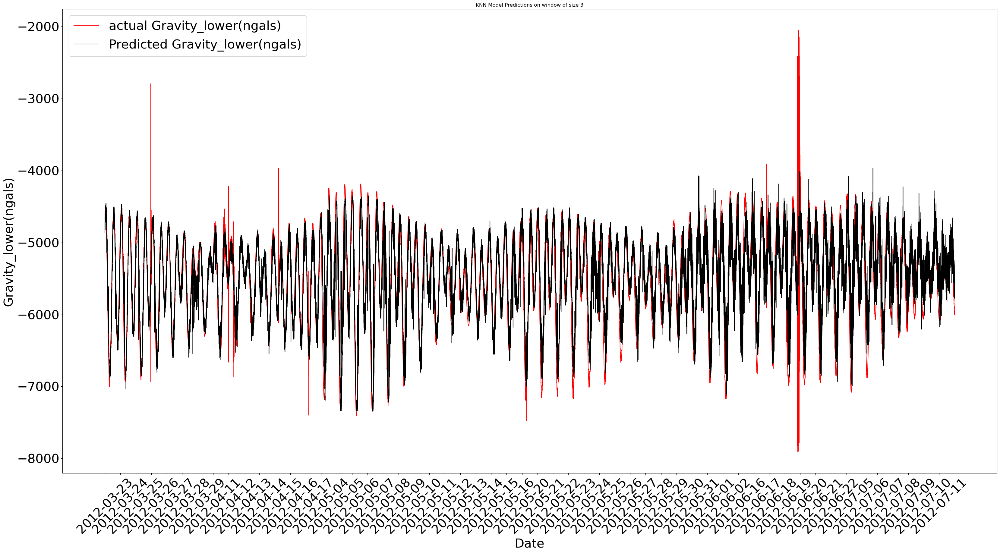

In [94]:
knn_W3 = KNeighborsRegressor(n_neighbors = 15, weights='distance', n_jobs = -1)
# apply_model_10by10CV(X_train_S1W1, X_test_S1W1, y_train_S1W1, y_test_S1W1, knn_S1W1)
knn_W3.fit(X_train_W3, y_train_W3)

y_pred_knn_W3 = knn_W3.predict(np.array(X_test_W3))

get_performance(y_test_W3.astype(float), y_pred_knn_W3.astype(float))
prediction_plot(y_test_W3, y_pred_knn_W3, test_sample_dates_W3, "KNN", 3)

## Random Forest

In [95]:
# model = RandomForestRegressor(n_estimators=300, criterion="squared_error", max_depth = 14, min_samples_split = 2,\
#                               min_samples_leaf = 1, max_features = 1.0, max_leaf_nodes = None, min_impurity_decrease= 0, \
#                               bootstrap = True, n_jobs = -1, random_state = None, verbose=1, max_samples=1.0)
# apply_model_10by10CV(X_train_S1W1, X_test_S1W1, y_train_S1W1, y_test_S1W1, model)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   30.0s finished
/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done 300 out of 300 | elapsed:    0.2s finished
/home/raghav/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_1010941/1782918297.py:6: RuntimeWarning: invalid va

RMSE value:  332.42039966044877
RMSLE value:  nan
MAPE value:  0.04225917470929027
percentage bias:  -0.49652638504544144


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


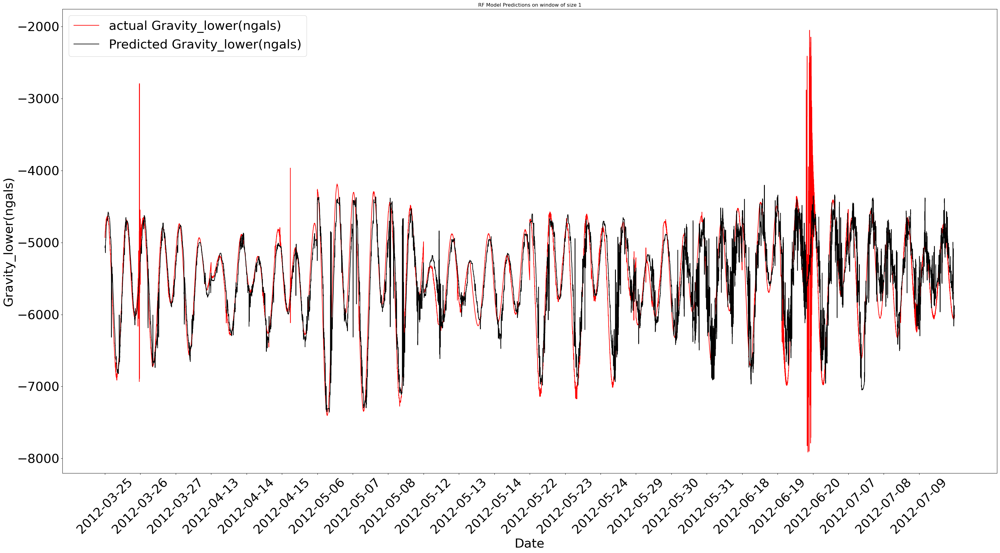

In [96]:
RF_W1 = RandomForestRegressor(n_estimators=300, criterion="squared_error", max_depth = 14, min_samples_split = 2,\
                              min_samples_leaf = 1, max_features = 1.0, max_leaf_nodes = None, min_impurity_decrease= 0, \
                              bootstrap = True, n_jobs = -1, random_state = None, verbose=1, max_samples=1.0)

RF_W1.fit(X_train_W1, y_train_W1)

y_pred_RF_W1 = RF_W1.predict(np.array(X_test_W1))

get_performance(y_test_W1.astype(float), y_pred_RF_W1.astype(float))
prediction_plot(y_test_W1, y_pred_RF_W1, test_sample_dates_W1, "RF", 1)

In [98]:

joblib.dump(RF_W1, r"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/random_forest_on_gravity_data_W1.pkl")

['/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/random_forest_on_gravity_data_W1.pkl']

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   23.8s finished
/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:    0.2s
[Parallel(n_jobs=12)]: Done 300 out of 300 | elapsed:    0.3s finished
/home/raghav/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_1010941/4267932534.py:6: RuntimeWarning: invalid va

RMSE value:  341.12022276471794
RMSLE value:  nan
MAPE value:  0.044642441798121664
percentage bias:  -0.7387794207211794


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


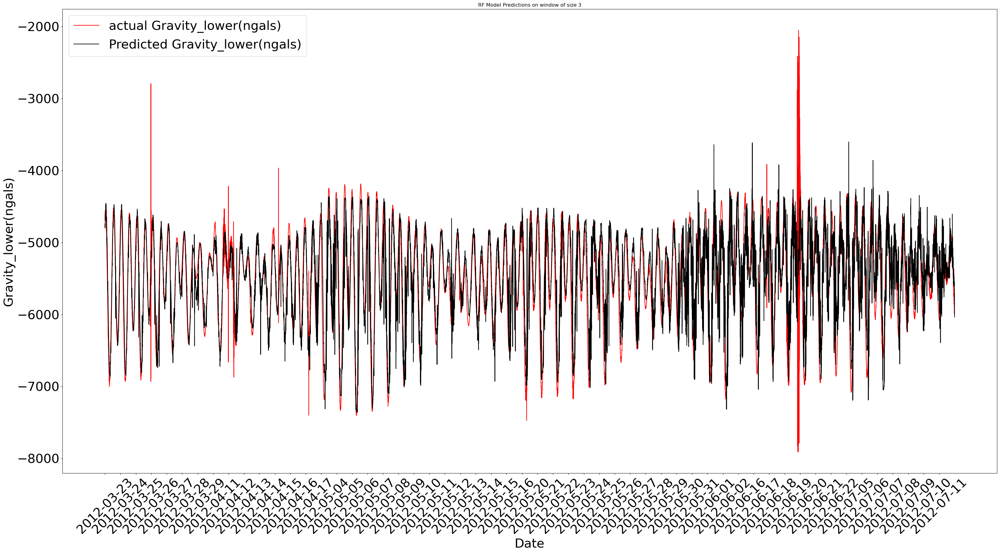

In [99]:
RF_W3 = RandomForestRegressor(n_estimators=300, criterion="squared_error", max_depth = 14, min_samples_split = 2,\
                              min_samples_leaf = 1, max_features = 1.0, max_leaf_nodes = None, min_impurity_decrease= 0, \
                              bootstrap = True, n_jobs = -1, random_state = None, verbose=1, max_samples=1.0)

RF_W3.fit(X_train_W3, y_train_W3)

y_pred_RF_W3 = RF_W3.predict(np.array(X_test_W3))

get_performance(y_test_W3.astype(float), y_pred_RF_W3.astype(float))
prediction_plot(y_test_W3, y_pred_RF_W3, test_sample_dates_W3, "RF", 3)

In [100]:
joblib.dump(RF_W3, r"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/random_forest_on_gravity_data_W3.pkl")

['/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/random_forest_on_gravity_data_W3.pkl']

RMSE value:  326.1251816140686
RMSLE value:  nan
MAPE value:  0.04180151855560184
percentage bias:  -0.5088090867189883


/home/raghav/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_1010941/4267932534.py:6: RuntimeWarning: invalid value encountered in log
  LOG_e = np.square(np.log(actual+1)-np.log(pred+1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


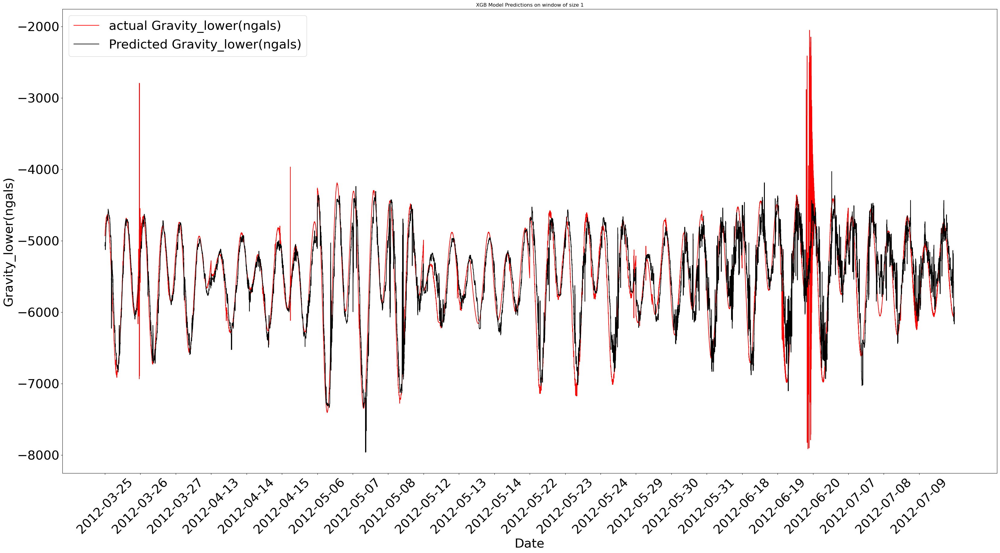

RMSE value:  337.1857927981397
RMSLE value:  nan
MAPE value:  0.044524672570694285
percentage bias:  -0.7125849426570731


/home/raghav/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_1010941/4267932534.py:6: RuntimeWarning: invalid value encountered in log
  LOG_e = np.square(np.log(actual+1)-np.log(pred+1))
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


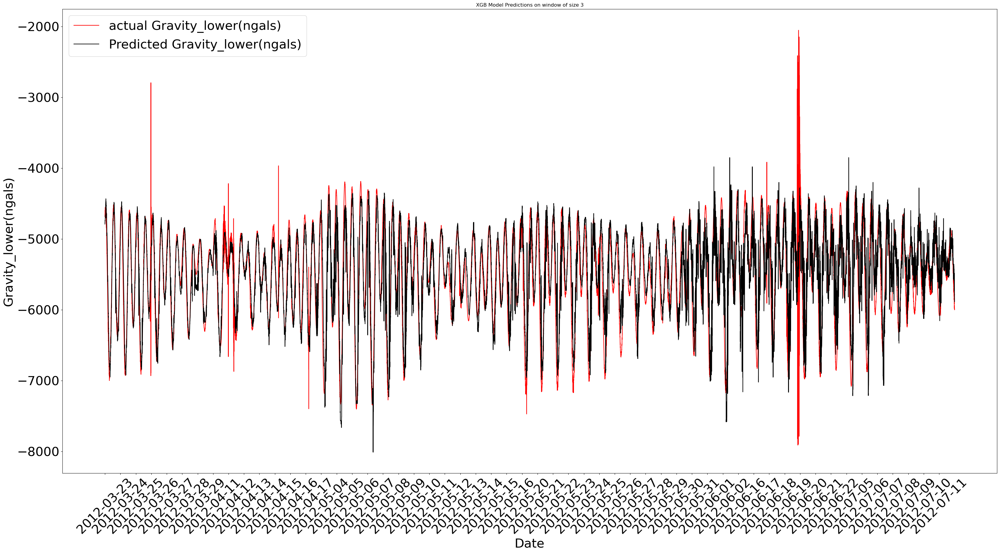

['/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/XGBoost_on_gravity_data_W3.pkl']

In [101]:

XGB_W1 = XGBRegressor(n_estimators=800, max_depth=6, learning_rate =0.1, n_jobs=-1)
XGB_W1.fit(X_train_W1, y_train_W1)

y_pred_XGB_W1 = XGB_W1.predict(np.array(X_test_W1))

get_performance(y_test_W1.astype(float), y_pred_XGB_W1.astype(float))
prediction_plot(y_test_W1, y_pred_XGB_W1, test_sample_dates_W1, "XGB", 1)


XGB_W3 = XGBRegressor(n_estimators=800, max_depth=6, learning_rate =0.1, n_jobs=-1)
XGB_W3.fit(X_train_W3, y_train_W3)

y_pred_XGB_W3 = XGB_W3.predict(np.array(X_test_W3))

get_performance(y_test_W3.astype(float), y_pred_XGB_W3.astype(float))
prediction_plot(y_test_W3, y_pred_XGB_W3, test_sample_dates_W3, "XGB", 3)

joblib.dump(XGB_W1, r"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/XGBoost_on_gravity_data_W1.pkl")
joblib.dump(XGB_W3, r"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/XGBoost_on_gravity_data_W3.pkl")


### SVR linear

In [102]:
# SVR_lin_S1W1 = Pipeline([
#     ('scalar', StandardScaler()),
#     ('LinearSVR', LinearSVR(epsilon=0.5, C=10, tol=0.00001, max_iter=1000)) #loss='squared_epsilon_insensitive' can also be used
#     # dual = false when n_samples > n_features
# ]
# )
# # apply_model_10by10CV(X_train_S1W1, X_test_S1W1, y_train_S1W1, y_test_S1W1, SVR_lin_S1W1)

# SVR_lin_S1W1.fit(X_train_S1W1, y_train_S1W1)

# y_pred_S1W1 = SVR_lin_S1W1.predict(X_test_S1W1)
# get_performance(y_test_S1W1, y_pred_S1W1)
# prediction_plot(y_test_S1W1, y_pred_S1W1, "Linear SVR")

In [103]:
result_df = pd.DataFrame(columns=["model_name", "MeasuredData", "PredictedData"])
# joblib.dump(XGB_W1, r"XGBoost_on_gravity_data_W1.pkl")
# joblib.dump(XGB_W3, r"XGBoost_on_gravity_data_W3.pkl")

In [144]:
pred_results = [y_pred_knn_W1, y_pred_knn_W3, y_pred_RF_W1, y_pred_RF_W3, y_pred_XGB_W1, y_pred_XGB_W3]
actual_values =[y_test_W1.values.tolist(), y_test_W3.values.tolist(), y_test_W1.values.tolist(), y_test_W3.values.tolist(), y_test_W1.values.tolist(), y_test_W3.values.tolist()]
models = ["KNN_W1", "KNN_W3", "RF_W1", "RF_W3", "XGB_W1", "XGB_W3"]
result_df["model_name"] = models
result_df["MeasuredData"] = actual_values
result_df["PredictedData"] = pred_results
# result_df.to_csv("predication_results_on_gravity_data.csv")

### SVR radial

- Tune SVR radial model, because result are getting improved if we change the parameters

In [105]:
SVR_rbf_W1 = Pipeline([
    ('scalar', StandardScaler()),
    ('SVRrbf', SVR(kernel='rbf', epsilon=2.5, C=500, gamma=5, tol=0.0000001))
]
)
# apply_model_10by10CV(X_train_S1W1, X_test_S1W1, y_train_S1W1, y_test_S1W1, SVR_rbf_S1W1)
SVR_rbf_W1.fit(X_train_W1, y_train_W1)

y_pred_rbf_W1 = SVR_rbf_W1.predict(X_test_W1)
get_performance(y_test_W1, y_pred_rbf_W1)
prediction_plot(y_test_W1, y_pred_rbf_W1, test_sample_dates_W1, "SVR radial kernel")

RMSE value:  288.2332479611994
RMSLE value:  nan
MAPE value:  0.037199704139200054
percentage bias:  -0.9185618330497962


/home/raghav/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_1010941/4267932534.py:6: RuntimeWarning: invalid value encountered in log
  LOG_e = np.square(np.log(actual+1)-np.log(pred+1))


TypeError: prediction_plot() missing 1 required positional argument: 'w_size'

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


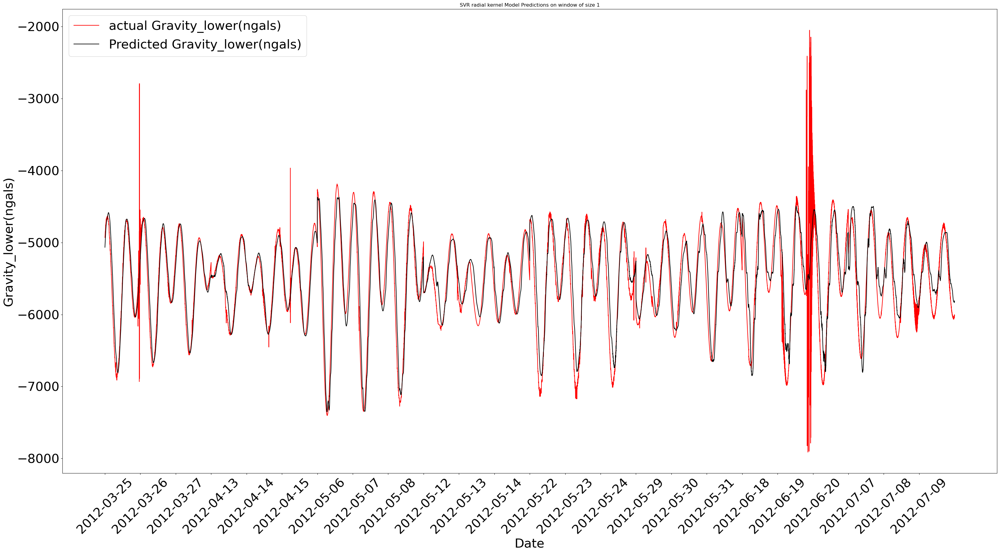

In [107]:
prediction_plot(y_test_W1, y_pred_rbf_W1, test_sample_dates_W1, "SVR radial kernel", 1)

In [106]:
joblib.dump(SVR_rbf_W1, r"SVR_on_gravity_data_W1.pkl")

['SVR_on_gravity_data_W1.pkl']

In [ ]:
# SVR_rbf_W3 = Pipeline([
#     ('scalar', StandardScaler()),
#     ('SVRrbf', SVR(kernel='rbf', epsilon=2.5, C=500, gamma=5, tol=0.0000001))
# ]
# )
# # apply_model_10by10CV(X_train_S1W1, X_test_S1W1, y_train_S1W1, y_test_S1W1, SVR_rbf_S1W1)
# SVR_rbf_W3.fit(X_train_W3, y_train_W3)

# y_pred_rbf_W3 = SVR_rbf_W3.predict(X_test_W3)
# get_performance(y_test_W3, y_pred_rbf_W3)
# prediction_plot(y_test_W3, y_pred_rbf_W3, test_sample_dates_W3, "SVR radial kernel")

In [ ]:
# joblib.dump(SVR_rbf_W3, r"SVR_on_gravity_data_W3.pkl")

### Visualization plot of anomalies in time series data

In [116]:
def get_anomaly_plot(y_prediction, y_actual, w_size, model_name, no_of_events, per_day_samples, dates):
    y_predicaiton = np.array(y_prediction)
    mean_line = np.mean(y_prediction)
    std1 = np.std(y_prediction)
    std2 = 2*std1
    n_days = w_size*2 + 1
    n_samples = n_days*per_day_samples
    # setting1_EQs = ['2/9/2020', '5/7/2020', '23/8/2020', '7/1/2021']
    # S1W4DS_test = Window4DS[Window4DS['Setting 1']==1]
    # S1W4DS_test.reset_index(drop=True, inplace=True)
    # EQ_ind = find_index_of_SA(S1W4DS_test, setting1_EQs)
    y_actual = np.array(y_actual)
    plt.figure(figsize = (30,15))
    handle_1, = plt.plot(np.array(y_actual), color='red', label="Actual Gravity value")
    handle_2, = plt.plot(np.array(y_prediction), color='black', label="Predicted Gravity value")
    handle_3, = plt.plot(np.array(len(y_prediction)*[mean_line]), color = 'green', linewidth=4, label="Mean Prediction value")
    # plt.scatter([i for i in range(len(y_pred_XGB_S4W3))], np.array(y_pred_XGB_S4W3), s=10)
    # plt.scatter([i for i in range(len(y_test_S4W3))], np.array(y_test_S4W3), s=10)
    handle_4, =plt.plot(np.array(len(y_prediction)*[mean_line + std2]), '--', color = 'green', label="Upper bound")
    handle_5, =plt.plot(np.array(len(y_prediction)*[mean_line - std2]), '--', color = 'green', label="Lower bound")
    # for EQ in EQ_ind:
    #     plt.scatter(EQ, 5700, color = "red", s=300)
    for i in range(no_of_events):
        start = i*n_samples
        # plt.scatter(start+73, 7000, color = "red", s=300)
        plt.fill_betweenx([i for i in range(int(np.min(y_actual)),int(np.max(y_actual)))], start, start + n_samples, alpha = 0.2)

    anomaly_indices = []
    for i in range(len(y_actual)):
        if y_actual[i] > mean_line + std2 or y_actual[i] < mean_line - std2:
            # plt.scatter(i, y_actual[i], marker='x', color='maroon', s=100)
            anomaly_indices.append(i)

    anomaly_indices = np.array(anomaly_indices)
    # print(anomaly_indices)
    for i in range(0,len(y_actual),n_samples):
    # print(i, i+n_samples)
        interval_min_ind = i
        interval_max_ind = i+n_samples
        # array of indices present in corresponding interval(i.e. amonaly indeices of correspopnding earthquake event)
        anomaly_indices_interval = anomaly_indices[(anomaly_indices>interval_min_ind)*(anomaly_indices<interval_max_ind)]
        np.save(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/Anomaly_data/Anomalies_indices_interval_{(i+1)//n_samples}_{model_name}_W{w_size}.npy", anomaly_indices_interval)
        print(f"no. of anomalies found in interval {(i+1)//n_samples}:", len(anomaly_indices_interval))
        if anomaly_indices_interval.size != 0:
            first_occurence = min(anomaly_indices_interval)
            last_occurence = max(anomaly_indices_interval)
            handle_6 = plt.scatter(first_occurence, y_actual[first_occurence], marker='x', color='maroon', s=300, linewidths=5, label="Anomalies")
            plt.scatter(last_occurence, y_actual[last_occurence], marker='x', color='maroon', s=300, linewidths=5)
    plt.fill_between([i for i in range(len(y_prediction))], np.array(len(y_prediction)*[mean_line + std2]), np.array(len(y_prediction)*[mean_line - std2]), color='green', alpha=0.5)


    # plt.xticks(fontsize=30)
    plt.xticks([i for i in range(0, len(dates.values), per_day_samples)], dates.dt.strftime('%Y-%m-%d').values[::per_day_samples], rotation=45, fontsize=20)
    plt.yticks(fontsize=30)
    plt.xlabel("Samples", fontsize=30)
    plt.ylabel("Gravity_lower(ngals)", fontsize=30)
    # plt.legend(['actual RN concentration', 'Predicted RN', 'Mean Prediction value', 'Upper bound', 'Lower bound', 'Seismic Events'], loc='best',fontsize=20)
    plt.legend(loc='best', fontsize=20, handles=[handle_1, handle_2, handle_3, handle_4, handle_5, handle_6])
    plt.title(f"Anomaly detection on Gravity time series of all seismic events with Window size {w_size} ({model_name})", fontsize=30)
    plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/Anomaly_data/Anomaly_detection_{model_name}_w{w_size}.pdf", format="pdf",bbox_inches="tight")
    plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/Anomaly_data/Anomaly_detection_{model_name}_w{w_size}.eps", format="eps",bbox_inches="tight")
    plt.show()

In [136]:

y_pred_train_knn_W1 = knn_W1.predict(np.array(X_train_W1))
y_pred_train_knn_W3 = knn_W3.predict(np.array(X_train_W3))

y_pred_train_RF_W1 = RF_W1.predict(np.array(X_train_W1))
y_pred_train_RF_W3 = RF_W3.predict(np.array(X_train_W3))

y_pred_train_XGB_W1 = XGB_W1.predict(np.array(X_train_W1))
y_pred_train_XGB_W3 = XGB_W3.predict(np.array(X_train_W3))

result_df["ActualTrainingData"] = [y_train_W1.values.tolist(), y_train_W3.values.tolist(), y_train_W1.values.tolist(), y_train_W3.values.tolist(), y_train_W1.values.tolist(), y_train_W3.values.tolist()]
result_df["PredictedTrainingData"] = [y_pred_train_knn_W1, y_pred_train_knn_W3, y_pred_train_RF_W1, y_pred_train_RF_W3, y_pred_train_XGB_W1, y_pred_train_XGB_W3]
result_df.head()

/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(
/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(
/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:    0.4s
[Parallel(n_jobs=12)]: Done 300 out of 300 | elapsed:    0.6s finished
/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but RandomForest

,model_name,MeasuredData,PredictedData,ActualTrainingData,PredictedTrainingData
0,KNN_W1,"[-4930.8006961, -4927.1367822, -4919.6981136, ...","[-5025.469584109298, -5089.571622115442, -5076...","[-4520.5000414, -4509.1558236, -4497.8265602, ...","[-4520.5000414, -4509.1558236, -4497.8265602, ..."
1,KNN_W3,"[-4686.2224416, -4677.6940332, -4677.5690878, ...","[-4862.606481838961, -4791.602772636232, -4736...","[-4520.5000414, -4509.1558236, -4497.8265602, ...","[-4520.5000414, -4509.1558236, -4497.8265602, ..."
2,RF_W1,"[-4930.8006961, -4927.1367822, -4919.6981136, ...","[-5068.988454236733, -5063.693230107842, -5061...","[-4520.5000414, -4509.1558236, -4497.8265602, ...","[-4734.8578733973245, -4656.468794957169, -463..."
3,RF_W3,"[-4686.2224416, -4677.6940332, -4677.5690878, ...","[-4797.953911959994, -4791.118717078387, -4780...","[-4520.5000414, -4509.1558236, -4497.8265602, ...","[-4694.8977568858845, -4683.329462807227, -465..."
4,XGB_W1,"[-4930.8006961, -4927.1367822, -4919.6981136, ...","[-5071.684, -5064.4346, -5059.9404, -5061.1157...","[-4520.5000414, -4509.1558236, -4497.8265602, ...","[-5048.0317, -5033.0435, -5022.475, -5015.2256..."


no. of anomalies found in interval 0: 271
no. of anomalies found in interval 1: 1
no. of anomalies found in interval 2: 1093
no. of anomalies found in interval 3: 0
no. of anomalies found in interval 4: 692
no. of anomalies found in interval 5: 65
no. of anomalies found in interval 6: 676
no. of anomalies found in interval 7: 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


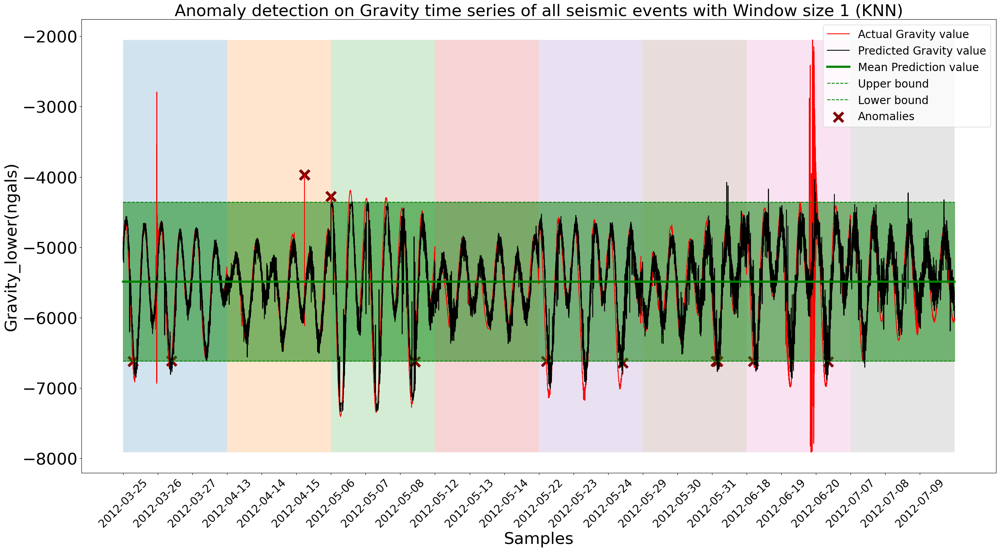

In [118]:
knn_w1_data = result_df[result_df["model_name"]=="KNN_W1"]
get_anomaly_plot(y_pred_knn_W1, y_test_W1, w_size=1, model_name="KNN", no_of_events=len(seismic_selected_events_df), per_day_samples=1440, dates=test_sample_dates_W1)

no. of anomalies found in interval 0: 673
no. of anomalies found in interval 1: 16
no. of anomalies found in interval 2: 2374
no. of anomalies found in interval 3: 248
no. of anomalies found in interval 4: 1297
no. of anomalies found in interval 5: 762
no. of anomalies found in interval 6: 1557
no. of anomalies found in interval 7: 244


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


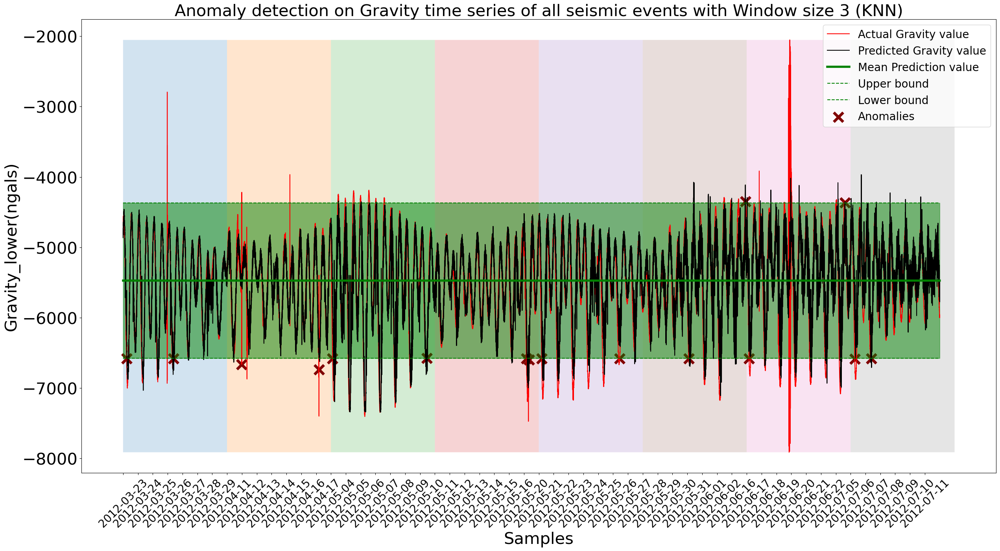

In [119]:
dates = test_sample_dates_W3
w_size = 3
y_prediction = y_pred_knn_W3
y_actual = y_test_W3
get_anomaly_plot(y_prediction, y_actual, w_size=w_size, model_name="KNN", no_of_events=len(seismic_selected_events_df), per_day_samples=1440, dates=dates)

no. of anomalies found in interval 0: 227
no. of anomalies found in interval 1: 1
no. of anomalies found in interval 2: 958
no. of anomalies found in interval 3: 0
no. of anomalies found in interval 4: 652
no. of anomalies found in interval 5: 0
no. of anomalies found in interval 6: 618
no. of anomalies found in interval 7: 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


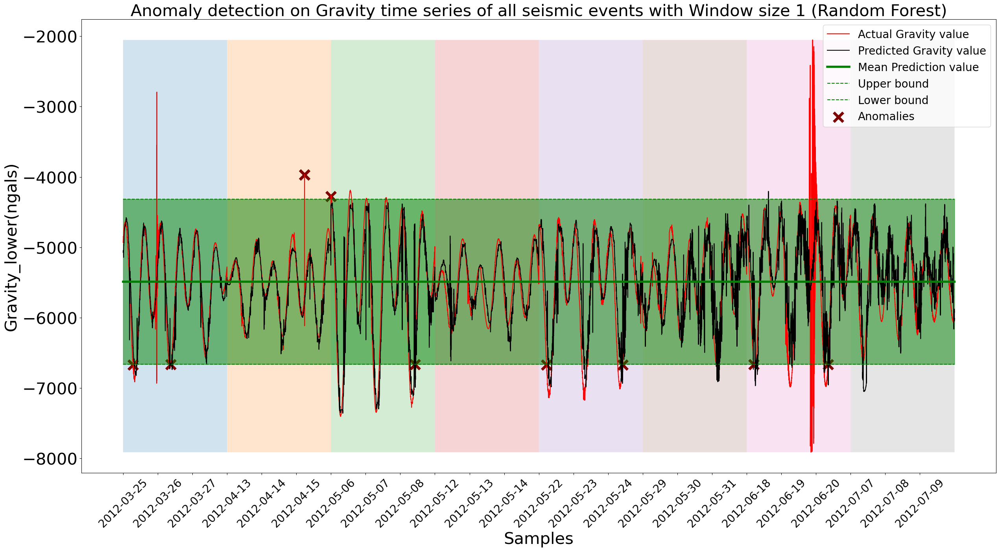

In [120]:
dates = test_sample_dates_W1
w_size = 1
y_prediction = y_pred_RF_W1
y_actual = y_test_W1
get_anomaly_plot(y_prediction, y_actual, w_size=w_size, model_name="Random Forest", no_of_events=len(seismic_selected_events_df), per_day_samples=1440, dates=dates)

no. of anomalies found in interval 0: 562
no. of anomalies found in interval 1: 12
no. of anomalies found in interval 2: 1899
no. of anomalies found in interval 3: 230
no. of anomalies found in interval 4: 1096
no. of anomalies found in interval 5: 469
no. of anomalies found in interval 6: 1318
no. of anomalies found in interval 7: 155


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


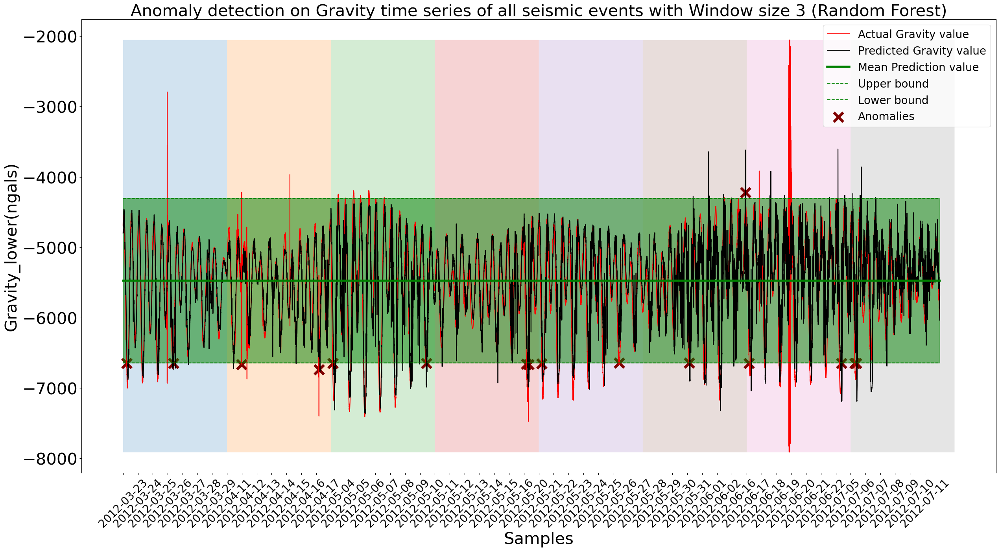

In [121]:
dates = test_sample_dates_W3
w_size = 3
y_prediction = y_pred_RF_W3
y_actual = y_test_W3
get_anomaly_plot(y_prediction, y_actual, w_size=w_size, model_name="Random Forest", no_of_events=len(seismic_selected_events_df), per_day_samples=1440, dates=dates)

no. of anomalies found in interval 0: 244
no. of anomalies found in interval 1: 1
no. of anomalies found in interval 2: 1018
no. of anomalies found in interval 3: 0
no. of anomalies found in interval 4: 668
no. of anomalies found in interval 5: 17
no. of anomalies found in interval 6: 645
no. of anomalies found in interval 7: 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


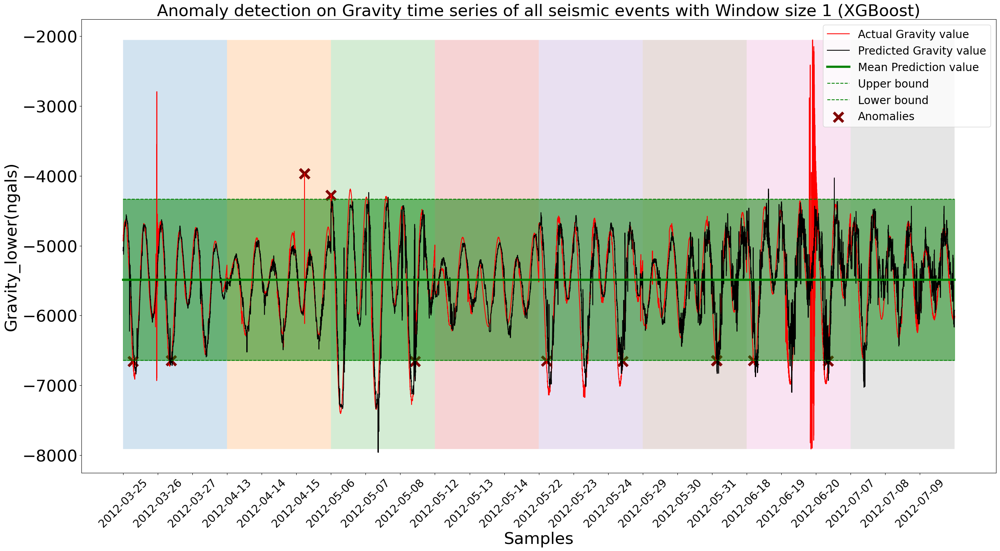

In [122]:
dates = test_sample_dates_W1
w_size = 1
y_prediction = y_pred_XGB_W1
y_actual = y_test_W1
get_anomaly_plot(y_prediction, y_actual, w_size=w_size, model_name="XGBoost", no_of_events=len(seismic_selected_events_df), per_day_samples=1440, dates=dates)

no. of anomalies found in interval 0: 573
no. of anomalies found in interval 1: 13
no. of anomalies found in interval 2: 2031
no. of anomalies found in interval 3: 232
no. of anomalies found in interval 4: 1131
no. of anomalies found in interval 5: 530
no. of anomalies found in interval 6: 1346
no. of anomalies found in interval 7: 158


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


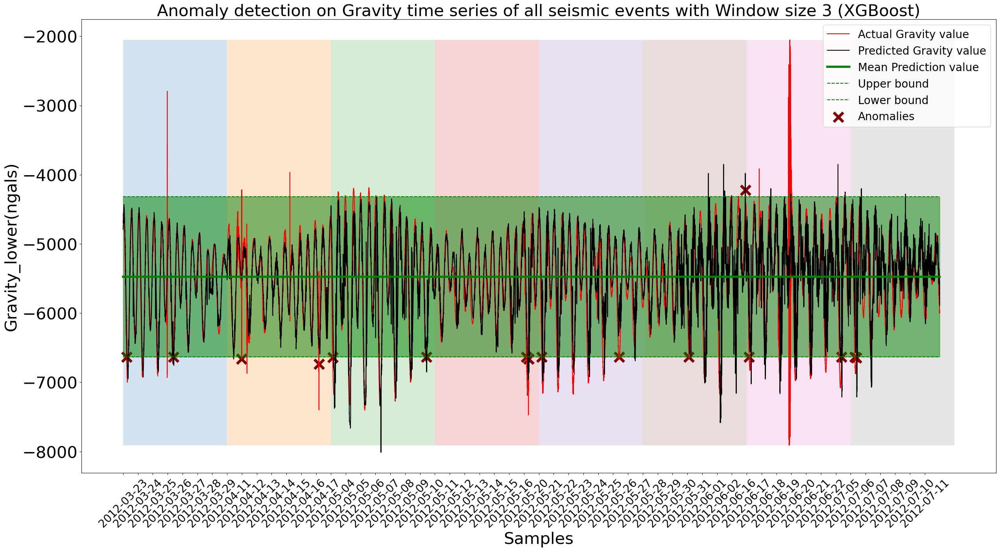

In [123]:
dates = test_sample_dates_W3
w_size = 3
y_prediction = y_pred_XGB_W3
y_actual = y_test_W3
get_anomaly_plot(y_prediction, y_actual, w_size=w_size, model_name="XGBoost", no_of_events=len(seismic_selected_events_df), per_day_samples=1440, dates=dates)

In [124]:
# !zip -r /content/Anomaly_data.zip /content/Anomaly_data/

## Correlation plots of all model results

In [230]:
import numpy as np
import matplotlib.pyplot as plt

def get_correlation_plot(row):
    model_name = row["model_name"]
    # x = np.array(row['MeasuredData'])
    # y = np.array(row['PredictedData'])
    x = row['MeasuredData']
    y = row['PredictedData']
    x_t = row['ActualTrainingData']
    y_t = row['PredictedTrainingData']
#     print(len(x), y.shape)
    r = np.corrcoef(x, y)[0,1]
    
#     print(type(x_t))
    x_new = x.copy() + x_t.copy()
#     y_new = y.extend(y_t)
    y_new = np.concatenate((y,y_t), axis=None)
    
#     print(x)
#     print(len(x_new), y_new.shape)

    fit = np.polyfit(x_new, y_new, 1)
    fit_fn = np.poly1d(fit)
    y_fit = fit_fn(x_new)
    y_std = np.std(y_new-y_fit)
    #  Define the confidence interval
    # ci = 0.9 * np.std(y) / np.mean(y)
    
    # Calculate residuals
    residuals = y_new - y_fit
    print(residuals)
    mean_residual = np.mean(residuals)
    std_residual = np.std(residuals)

    # Compute 95% confidence interval for the fitted line
    confidence_interval = stats.t.interval(0.95, len(residuals)-1, loc=mean_residual, scale=std_residual/np.sqrt(len(residuals)))
    # try it once
    # ci = 0.9 * np.std(y) / np.mean(y)
    # x_upper = x + ci
    # y_upper = fit_fn(x_upper)
    # x_lower = x - ci
    # y_lower = fit_fn(x_lower)


    plt.scatter(x, y, color='green', s=5, alpha=0.4, label='testing samples')
    plt.scatter(x_t, y_t, color='orange', s=5, alpha=0.4, label='training samples')
    # plt.scatter(x, x, color='r', label='x', marker='x')
    plt.plot(x_new, y_fit, color='black', label='Fit Line', alpha=0.9)
#     plt.fill_between(x, y - y_std, y + y_std, color='gray', alpha=0.2, label='Confidence Interval')
#     plt.fill_between(x_new, y_fit + confidence_interval[0], y_fit + confidence_interval[1], color='grey', alpha=0.3, label='95% Confidence Interval')
#     plt.plot(x_new, y_fit + confidence_interval[0], color='black', label='Upper interval line', alpha=0.9, linestyle='--')
#     plt.plot(x_new, y_fit + confidence_interval[1], color='black', label='Lower interval line', alpha=0.9, linestyle='--')

    # plt.fill_between(x, (y_fit-ci), (y_fit+ci), color='g', alpha=0.3)
    # try this also
    # plt.fill_between(x, y_lower, y_upper, color='g', alpha=0.3)

    plt.xlabel('Measured Gravity data')
    plt.ylabel('Predicted Gravity data')
    plt.title(f"Correlation analysis of {model_name}, r = {r:.2f}", fontweight="bold")
    plt.legend()
    plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/correlation_plots/{model_name}_corr_plot.pdf", format="pdf", bbox_inches="tight")
    plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/correlation_plots/{model_name}_corr_plot.eps", format="eps", bbox_inches="tight")
    # rename the folder after completion from Ex4_Results_paper to Ex4_Results_correaltions
    plt.show()
    return r



In [231]:
result_df['ActualTrainingData'].apply(len)

0    259140
1    214500
2    259140
3    214500
4    259140
5    214500
Name: ActualTrainingData, dtype: int64

In [232]:
result_df['PredictedTrainingData'].apply(len)

0    259140
1    214500
2    259140
3    214500
4    259140
5    214500
Name: PredictedTrainingData, dtype: int64

[ -82.6604368  -150.32999636 -144.53444743 ...   12.55606964   12.4531861
   12.35166706]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


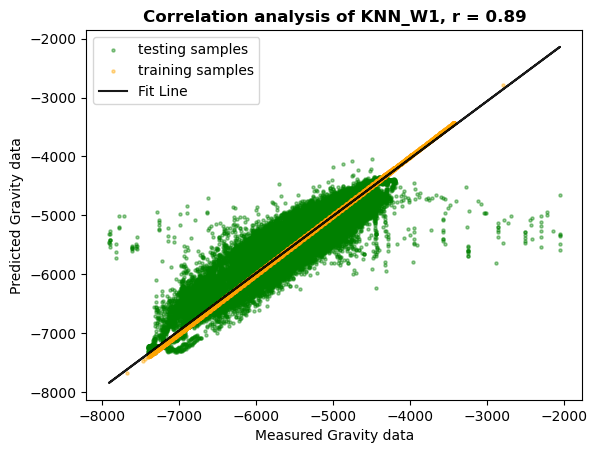

[-132.89323327  -69.85337178  -14.91880531 ...   28.67821673   28.41934104
   28.16389873]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


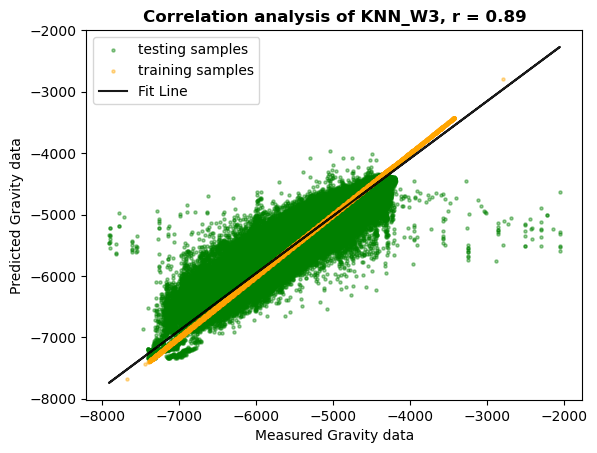

[-62.59122295 -60.46290183 -64.50680002 ... 238.49933198 241.14687073
 244.84007028]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


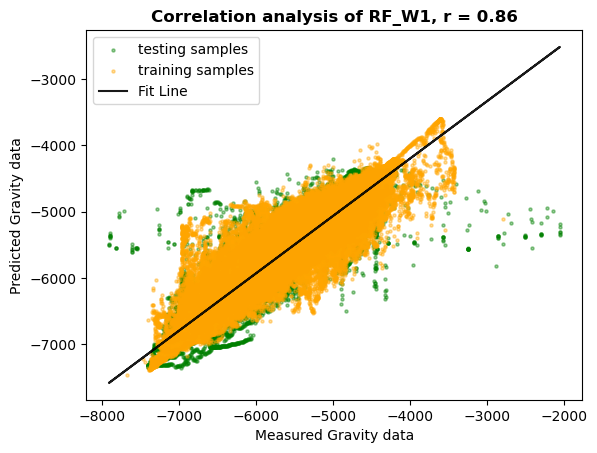

[ -0.70481108  -1.13794648   8.89574364 ... 195.86729753 197.06306139
 201.44718772]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


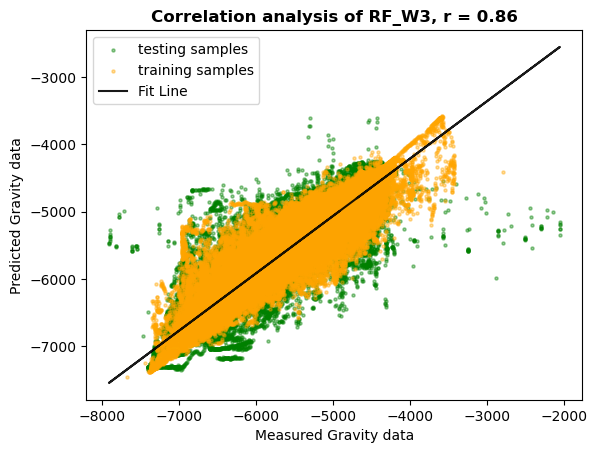

[-50.62500898 -46.45100343 -48.20091542 ... 151.25514872 154.53776387
 157.77684272]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


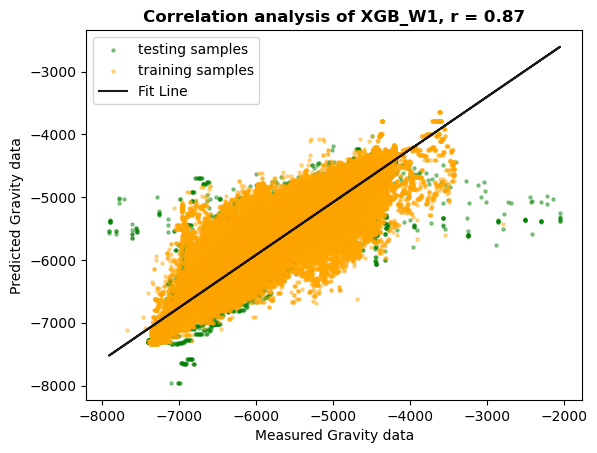

[ 26.3449733   19.27795426  23.27549316 ... 215.64195251 157.68473496
 225.42330871]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


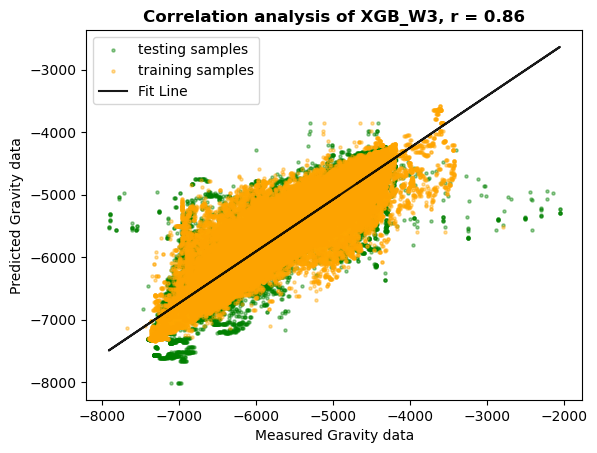

In [233]:
correlation_values = []
for ind,row in result_df.iterrows():
    r = get_correlation_plot(row)
    correlation_values.append(r)

result_df["Corrlation coefficient(r)"] = correlation_values

In [234]:
result_df.to_csv("predication_results_on_gravity_data.csv")

In [77]:
# !zip -r /content/Correlation_plots.zip /content/Correlation_plots/

  adding: content/Correlation_plots/ (stored 0%)
  adding: content/Correlation_plots/KNN_W1_corr_plot.pdf (deflated 1%)
  adding: content/Correlation_plots/XGB_W1_corr_plot.eps (deflated 72%)
  adding: content/Correlation_plots/RF_W1_corr_plot.eps (deflated 66%)
  adding: content/Correlation_plots/KNN_W3_corr_plot.pdf (deflated 1%)
  adding: content/Correlation_plots/KNN_W3_corr_plot.eps (deflated 66%)
  adding: content/Correlation_plots/RF_W3_corr_plot.eps (deflated 67%)
  adding: content/Correlation_plots/KNN_W1_corr_plot.eps (deflated 66%)
  adding: content/Correlation_plots/RF_W3_corr_plot.pdf (deflated 1%)
  adding: content/Correlation_plots/XGB_W3_corr_plot.eps (deflated 72%)
  adding: content/Correlation_plots/XGB_W1_corr_plot.pdf (deflated 2%)
  adding: content/Correlation_plots/XGB_W3_corr_plot.pdf (deflated 1%)
  adding: content/Correlation_plots/RF_W1_corr_plot.pdf (deflated 2%)


### Plotting number of samples in training and testing set of different windows

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


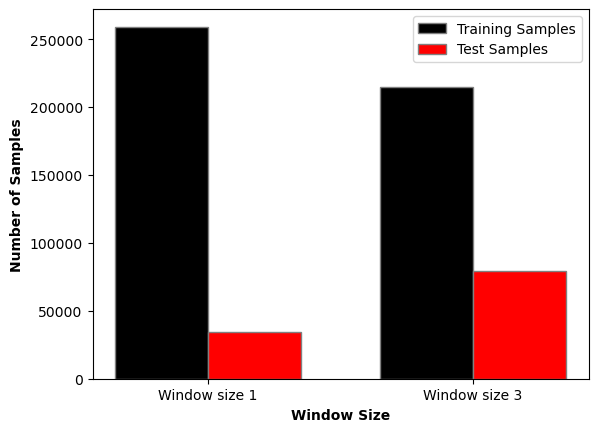

In [235]:
# Reset to default settings
plt.rcParams.update(plt.rcParamsDefault)
# Sample data
categories = ['Window size 1', 'Window size 3']
training_samples = [len(y_train_W1), len(y_train_W3)]  # Number of training samples for each category
test_samples = [len(y_test_W1), len(y_test_W3)]        # Number of test samples for each category

# Set the width of the bars
bar_width = 0.35

# Set position of bar on X axis
r1 = range(len(categories))
r2 = [x + bar_width for x in r1]

# Plot bars
plt.bar(r1, training_samples, color='black', width=bar_width, edgecolor='grey', label='Training Samples')
plt.bar(r2, test_samples, color='r', width=bar_width, edgecolor='grey', label='Test Samples')

# Add xticks on the middle of the group bars
plt.xlabel('Window Size', fontweight='bold')
plt.xticks([r + bar_width/2 for r in range(len(categories))], categories)

# Add y label
plt.ylabel('Number of Samples', fontweight='bold')

# Add legend
plt.legend()

plt.savefig("number_of_samples.pdf", format='pdf')
plt.savefig("number_of_samples.eps", format='eps')
# Show plot
plt.show()

In [67]:
# getting date and time of each anomalies
# anomaly_indices_KNN_W1_interval_0 = np.load("/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/Anomaly_data/Anomalies_indices_interval_0_KNN_W1.npy")
# anomaly_indices_KNN_W3_interval_0 = 
anomaly_idx_dict = {}
base_dir = "/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/Anomaly_data"
date_time_list_W1 = test_sample_dates_time_W1.tolist()
date_time_list_W3 = test_sample_dates_time_W3.tolist()
for file in sorted(os.listdir(base_dir)):
    
    if file.endswith(".npy"):
        key = "_".join(file.replace(".npy", "").split("_")[-4:])
        idx_list = np.load(os.path.join(base_dir, file))
        if idx_list.size:
            if key.endswith("W1"):
                anomaly_idx_dict[key] = [date_time_list_W1[idx_list.min()], date_time_list_W1[idx_list.max()]]
            elif key.endswith("W3"):
                anomaly_idx_dict[key] = [date_time_list_W3[idx_list.min()], date_time_list_W3[idx_list.max()]]
        else:
            anomaly_idx_dict[key] = [None, None]
        print(key)

interval_0_KNN_W1
interval_0_KNN_W3
interval_0_Random Forest_W1
interval_0_Random Forest_W3
interval_0_XGBoost_W1
interval_0_XGBoost_W3
interval_1_KNN_W1
interval_1_KNN_W3
interval_1_Random Forest_W1
interval_1_Random Forest_W3
interval_1_XGBoost_W1
interval_1_XGBoost_W3
interval_2_KNN_W1
interval_2_KNN_W3
interval_2_Random Forest_W1
interval_2_Random Forest_W3
interval_2_XGBoost_W1
interval_2_XGBoost_W3
interval_3_KNN_W1
interval_3_KNN_W3
interval_3_Random Forest_W1
interval_3_Random Forest_W3
interval_3_XGBoost_W1
interval_3_XGBoost_W3
interval_4_KNN_W1
interval_4_KNN_W3
interval_4_Random Forest_W1
interval_4_Random Forest_W3
interval_4_XGBoost_W1
interval_4_XGBoost_W3
interval_5_KNN_W1
interval_5_KNN_W3
interval_5_Random Forest_W1
interval_5_Random Forest_W3
interval_5_XGBoost_W1
interval_5_XGBoost_W3
interval_6_KNN_W1
interval_6_KNN_W3
interval_6_Random Forest_W1
interval_6_Random Forest_W3
interval_6_XGBoost_W1
interval_6_XGBoost_W3
interval_7_KNN_W1
interval_7_KNN_W3
interval_7_R

In [68]:
anomaly_idx_dict

{'interval_0_KNN_W1': [Timestamp('2012-03-25 06:47:00'),
  Timestamp('2012-03-26 09:28:00')],
 'interval_0_KNN_W3': [Timestamp('2012-03-23 05:42:00'),
  Timestamp('2012-03-26 09:38:00')],
 'interval_0_Random Forest_W1': [Timestamp('2012-03-25 06:51:00'),
  Timestamp('2012-03-26 09:06:00')],
 'interval_0_Random Forest_W3': [Timestamp('2012-03-23 05:52:00'),
  Timestamp('2012-03-26 09:15:00')],
 'interval_0_XGBoost_W1': [Timestamp('2012-03-25 06:49:00'),
  Timestamp('2012-03-26 09:15:00')],
 'interval_0_XGBoost_W3': [Timestamp('2012-03-23 05:51:00'),
  Timestamp('2012-03-26 09:17:00')],
 'interval_1_KNN_W1': [Timestamp('2012-04-15 05:41:00'),
  Timestamp('2012-04-15 05:41:00')],
 'interval_1_KNN_W3': [Timestamp('2012-04-11 23:46:00'),
  Timestamp('2012-04-17 04:41:00')],
 'interval_1_Random Forest_W1': [Timestamp('2012-04-15 05:41:00'),
  Timestamp('2012-04-15 05:41:00')],
 'interval_1_Random Forest_W3': [Timestamp('2012-04-11 23:46:00'),
  Timestamp('2012-04-17 04:41:00')],
 'interval_1

In [81]:
# sorted(model_name_list)

['KNN_first_occurence',
 'KNN_last_occurence',
 'Random_forest_first_occurence',
 'Random_forest_last_occurence',
 'XGBoost_first_occurence',
 'XGBoost_last_occurence']

In [88]:
model_name_list = [i+"_first_occurence" for i in ["KNN", "Random Forest", "XGBoost"]]
model_name_list.extend([i+"_last_occurence" for i in ["KNN", "Random Forest", "XGBoost"]])

for new_col_name in sorted(model_name_list):
    seismic_selected_events_df[new_col_name] = np.nan
seismic_selected_events_df_W1 = seismic_selected_events_df.copy()
seismic_selected_events_df_W3 = seismic_selected_events_df.copy()

seismic_selected_events_df_W1

,Year,Month,Day,Hour,Minute,Second,Lat,Long,Distance,Magnitude,date,date_with_time_with_sec,label,KNN_first_occurence,KNN_last_occurence,Random Forest_first_occurence,Random Forest_last_occurence,XGBoost_first_occurence,XGBoost_last_occurence
0,2012,3,26,5,32,54.6,23.452,70.388,18.4,3.5,2012-03-26,2012-03-26 05:32:54.600,SA,NaN,NaN,NaN,NaN,NaN,NaN
1,2012,4,14,3,22,59.1,23.391,70.537,18.9,4.1,2012-04-14,2012-04-14 03:22:59.100,SA,NaN,NaN,NaN,NaN,NaN,NaN
2,2012,5,7,11,25,31.4,23.409,70.352,31.4,3.7,2012-05-07,2012-05-07 11:25:31.400,SA,NaN,NaN,NaN,NaN,NaN,NaN
3,2012,5,13,20,47,30.2,23.409,70.170,29.8,3.5,2012-05-13,2012-05-13 20:47:30.200,SA,NaN,NaN,NaN,NaN,NaN,NaN
4,2012,5,23,23,55,49.5,23.562,70.410,20.8,3.7,2012-05-23,2012-05-23 23:55:49.500,SA,NaN,NaN,NaN,NaN,NaN,NaN
5,2012,5,30,9,23,38.5,23.394,70.043,18.5,3.5,2012-05-30,2012-05-30 09:23:38.500,SA,NaN,NaN,NaN,NaN,NaN,NaN
6,2012,6,19,20,14,0.4,23.645,70.283,11.1,5.3,2012-06-19,2012-06-19 20:14:00.400,SA,NaN,NaN,NaN,NaN,NaN,NaN
7,2012,7,8,8,58,25.4,23.632,70.283,10.7,3.5,2012-07-08,2012-07-08 08:58:25.400,SA,NaN,NaN,NaN,NaN,NaN,NaN


In [85]:
test_sample_dates_W1.unique()

array(['2012-03-25T00:00:00.000000000', '2012-03-26T00:00:00.000000000',
       '2012-03-27T00:00:00.000000000', '2012-04-13T00:00:00.000000000',
       '2012-04-14T00:00:00.000000000', '2012-04-15T00:00:00.000000000',
       '2012-05-06T00:00:00.000000000', '2012-05-07T00:00:00.000000000',
       '2012-05-08T00:00:00.000000000', '2012-05-12T00:00:00.000000000',
       '2012-05-13T00:00:00.000000000', '2012-05-14T00:00:00.000000000',
       '2012-05-22T00:00:00.000000000', '2012-05-23T00:00:00.000000000',
       '2012-05-24T00:00:00.000000000', '2012-05-29T00:00:00.000000000',
       '2012-05-30T00:00:00.000000000', '2012-05-31T00:00:00.000000000',
       '2012-06-18T00:00:00.000000000', '2012-06-19T00:00:00.000000000',
       '2012-06-20T00:00:00.000000000', '2012-07-07T00:00:00.000000000',
       '2012-07-08T00:00:00.000000000', '2012-07-09T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [92]:
for key, val in sorted(anomaly_idx_dict.items(), key=lambda x:x[0]):
    intervel_id = int(key.split("_")[1])
    model_name = key.split("_")[2]
    w_size = key.split("_")[3]
    
    if w_size == "W1":
        seismic_selected_events_df_W1.at[intervel_id, f"{model_name}_first_occurence"] = val[0]
        seismic_selected_events_df_W1.at[intervel_id, f"{model_name}_last_occurence"] = val[1]
    if w_size == "W3":
        seismic_selected_events_df_W3.at[intervel_id, f"{model_name}_first_occurence"] = val[0]
        seismic_selected_events_df_W3.at[intervel_id, f"{model_name}_last_occurence"] = val[1]

In [93]:
seismic_selected_events_df_W1

,Year,Month,Day,Hour,Minute,Second,Lat,Long,Distance,Magnitude,date,date_with_time_with_sec,label,KNN_first_occurence,KNN_last_occurence,Random Forest_first_occurence,Random Forest_last_occurence,XGBoost_first_occurence,XGBoost_last_occurence
0,2012,3,26,5,32,54.6,23.452,70.388,18.4,3.5,2012-03-26,2012-03-26 05:32:54.600,SA,2012-03-25 06:47:00,2012-03-26 09:28:00,2012-03-25 06:51:00,2012-03-26 09:06:00,2012-03-25 06:49:00,2012-03-26 09:15:00
1,2012,4,14,3,22,59.1,23.391,70.537,18.9,4.1,2012-04-14,2012-04-14 03:22:59.100,SA,2012-04-15 05:41:00,2012-04-15 05:41:00,2012-04-15 05:41:00,2012-04-15 05:41:00,2012-04-15 05:41:00,2012-04-15 05:41:00
2,2012,5,7,11,25,31.4,23.409,70.352,31.4,3.7,2012-05-07,2012-05-07 11:25:31.400,SA,2012-05-06 00:01:00,2012-05-08 10:15:00,2012-05-06 00:01:00,2012-05-08 10:07:00,2012-05-06 00:01:00,2012-05-08 10:08:00
3,2012,5,13,20,47,30.2,23.409,70.170,29.8,3.5,2012-05-13,2012-05-13 20:47:30.200,SA,None,None,None,None,None,None
4,2012,5,23,23,55,49.5,23.562,70.410,20.8,3.7,2012-05-23,2012-05-23 23:55:49.500,SA,2012-05-22 05:16:00,2012-05-24 10:12:00,2012-05-22 05:19:00,2012-05-24 10:02:00,2012-05-22 05:18:00,2012-05-24 10:11:00
5,2012,5,30,9,23,38.5,23.394,70.043,18.5,3.5,2012-05-30,2012-05-30 09:23:38.500,SA,2012-05-31 02:39:00,2012-05-31 03:44:00,None,None,2012-05-31 03:00:00,2012-05-31 03:23:00
6,2012,6,19,20,14,0.4,23.645,70.283,11.1,5.3,2012-06-19,2012-06-19 20:14:00.400,SA,2012-06-18 04:38:00,2012-06-20 08:25:00,2012-06-18 04:52:00,2012-06-20 08:21:00,2012-06-18 04:45:00,2012-06-20 08:23:00
7,2012,7,8,8,58,25.4,23.632,70.283,10.7,3.5,2012-07-08,2012-07-08 08:58:25.400,SA,None,None,None,None,None,None


In [94]:
seismic_selected_events_df_W3

,Year,Month,Day,Hour,Minute,Second,Lat,Long,Distance,Magnitude,date,date_with_time_with_sec,label,KNN_first_occurence,KNN_last_occurence,Random Forest_first_occurence,Random Forest_last_occurence,XGBoost_first_occurence,XGBoost_last_occurence
0,2012,3,26,5,32,54.6,23.452,70.388,18.4,3.5,2012-03-26,2012-03-26 05:32:54.600,SA,2012-03-23 05:42:00,2012-03-26 09:38:00,2012-03-23 05:52:00,2012-03-26 09:15:00,2012-03-23 05:51:00,2012-03-26 09:17:00
1,2012,4,14,3,22,59.1,23.391,70.537,18.9,4.1,2012-04-14,2012-04-14 03:22:59.100,SA,2012-04-11 23:46:00,2012-04-17 04:41:00,2012-04-11 23:46:00,2012-04-17 04:41:00,2012-04-11 23:46:00,2012-04-17 04:41:00
2,2012,5,7,11,25,31.4,23.409,70.352,31.4,3.7,2012-05-07,2012-05-07 11:25:31.400,SA,2012-05-04 02:39:00,2012-05-10 10:43:00,2012-05-04 02:47:00,2012-05-10 10:10:00,2012-05-04 02:46:00,2012-05-10 10:20:00
3,2012,5,13,20,47,30.2,23.409,70.170,29.8,3.5,2012-05-13,2012-05-13 20:47:30.200,SA,2012-05-20 03:54:00,2012-05-20 08:06:00,2012-05-20 04:04:00,2012-05-20 07:59:00,2012-05-20 04:02:00,2012-05-20 07:59:00
4,2012,5,23,23,55,49.5,23.562,70.410,20.8,3.7,2012-05-23,2012-05-23 23:55:49.500,SA,2012-05-21 04:38:00,2012-05-26 10:47:00,2012-05-21 04:44:00,2012-05-26 10:12:00,2012-05-21 04:43:00,2012-05-26 10:14:00
5,2012,5,30,9,23,38.5,23.394,70.043,18.5,3.5,2012-05-30,2012-05-30 09:23:38.500,SA,2012-05-31 02:25:00,2012-06-16 21:57:00,2012-05-31 03:00:00,2012-06-16 21:56:00,2012-05-31 02:44:00,2012-06-16 21:56:00
6,2012,6,19,20,14,0.4,23.645,70.283,11.1,5.3,2012-06-19,2012-06-19 20:14:00.400,SA,2012-06-17 03:50:00,2012-07-05 14:43:00,2012-06-17 04:02:00,2012-07-05 09:14:00,2012-06-17 04:01:00,2012-07-05 09:16:00
7,2012,7,8,8,58,25.4,23.632,70.283,10.7,3.5,2012-07-08,2012-07-08 08:58:25.400,SA,2012-07-06 06:40:00,2012-07-07 09:17:00,2012-07-06 06:51:00,2012-07-06 09:26:00,2012-07-06 06:49:00,2012-07-06 09:26:00


In [114]:
labelled_W3_df[labelled_W3_df['date'] == '2012-05-17']

,years,months,days,hours,minutes,Gravity_lower(ngals),Gravity_Upper(ngals),Barometric_pressure,Theriotical_tides,date,date_with_time,label
184319,2012,5,17,0,0,-5129.768532,-4086.901329,983.902827,525.159974,2012-05-17,2012-05-17 00:00:00,NSA
184320,2012,5,17,0,1,-5132.397880,-4093.160001,983.904593,520.998817,2012-05-17,2012-05-17 00:01:00,NSA
184321,2012,5,17,0,2,-5139.586533,-4101.082758,983.927976,516.782751,2012-05-17,2012-05-17 00:02:00,NSA
184322,2012,5,17,0,3,-5145.013427,-4110.246898,983.966932,512.511997,2012-05-17,2012-05-17 00:03:00,NSA
184323,2012,5,17,0,4,-5151.655592,-4118.844021,984.003970,508.186782,2012-05-17,2012-05-17 00:04:00,NSA
...,...,...,...,...,...,...,...,...,...,...,...,...
185754,2012,5,17,23,55,-4960.598194,-3938.760964,985.237813,702.703024,2012-05-17,2012-05-17 23:55:00,NSA
185755,2012,5,17,23,56,-4961.349408,-3944.877659,985.241116,700.439572,2012-05-17,2012-05-17 23:56:00,NSA
185756,2012,5,17,23,57,-4975.773534,-3946.854956,985.262168,698.111034,2012-05-17,2012-05-17 23:57:00,NSA
185757,2012,5,17,23,58,-4985.880292,-3961.312220,985.279163,695.717474,2012-05-17,2012-05-17 23:58:00,NSA


In [100]:
np.load("/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/Anomaly_data/Anomalies_indices_interval_3_KNN_W3.npy")

array([39114, 39115, 39116, 39117, 39118, 39119, 39120, 39121, 39122,
       39123, 39124, 39125, 39126, 39127, 39128, 39129, 39130, 39131,
       39132, 39133, 39134, 39135, 39136, 39137, 39138, 39139, 39140,
       39141, 39142, 39143, 39144, 39145, 39146, 39147, 39148, 39149,
       39150, 39151, 39152, 39153, 39154, 39155, 39156, 39157, 39158,
       39159, 39160, 39161, 39162, 39163, 39164, 39165, 39166, 39167,
       39168, 39169, 39170, 39171, 39172, 39173, 39174, 39175, 39176,
       39177, 39178, 39179, 39180, 39181, 39182, 39183, 39184, 39185,
       39186, 39187, 39188, 39189, 39190, 39191, 39192, 39193, 39194,
       39195, 39196, 39197, 39198, 39199, 39200, 39201, 39202, 39203,
       39204, 39205, 39206, 39207, 39208, 39209, 39210, 39211, 39212,
       39213, 39214, 39215, 39216, 39217, 39218, 39219, 39220, 39221,
       39222, 39223, 39224, 39225, 39226, 39227, 39228, 39229, 39230,
       39231, 39232, 39233, 39234, 39235, 39236, 39237, 39238, 39239,
       39240, 39241,

In [103]:
test_sample_dates_time_W3.tolist()[39114]

Timestamp('2012-05-20 03:54:00')

In [105]:
len(test_sample_dates_time_W3.tolist())

79200

In [113]:
test_sample_dates_time_W3.to_csv("tenp_date.csv")

In [117]:
def get_windowed_df(df, date_list, per_day_samples, window_size=1):
    for d in date_list:
        idx_list = df[df['date'] == d].index
        first_idx = idx_list[0]
        last_idx = idx_list[-1]

        new_first_idx = max(first_idx - (per_day_samples*window_size), 0)
        new_last_idx = min(last_idx + (per_day_samples*window_size), len(df)) #+1 because we are doing slicing operation
        if df.iloc[first_idx]['date'] == '2012-05-13':
            print(df.loc[new_first_idx:new_last_idx])
        if df.iloc[first_idx]['label']=='SA' and df.iloc[last_idx]['label']=='SA':
            # print("last:",new_last_idx)
            df.loc[new_first_idx:new_last_idx,'label'] = "SA"
        else:
            print("something wrong in index calculation")
    return df

In [118]:
get_windowed_df(labelled_df.copy(), seismic_selected_events_df.date.tolist(), per_day_samples=1440, window_size=3)

        years  months  days  hours  minutes  Gravity_lower(ngals)  \
105119   2012       3    23      0        0          -4686.222442   
105120   2012       3    23      0        1          -4677.694033   
105121   2012       3    23      0        2          -4677.569088   
105122   2012       3    23      0        3          -4675.325055   
105123   2012       3    23      0        4          -4670.777076   
...       ...     ...   ...    ...      ...                   ...   
115194   2012       3    29     23       55          -5376.515637   
115195   2012       3    29     23       56          -5376.473817   
115196   2012       3    29     23       57          -5376.428715   
115197   2012       3    29     23       58          -5376.380213   
115198   2012       3    29     23       59          -5376.328196   

        Gravity_Upper(ngals)  Barometric_pressure  Theriotical_tides  \
105119          -3889.091896           990.169230         583.546915   
105120          -3890.23043

,years,months,days,hours,minutes,Gravity_lower(ngals),Gravity_Upper(ngals),Barometric_pressure,Theriotical_tides,date,date_with_time,label
0,2012,1,10,0,1,-4520.500041,-3710.496912,998.090860,239.872880,2012-01-10,2012-01-10 00:01:00,NSA
1,2012,1,10,0,2,-4509.155824,-3702.142606,998.078372,249.694202,2012-01-10,2012-01-10 00:02:00,NSA
2,2012,1,10,0,3,-4497.826560,-3693.864818,998.066033,259.469495,2012-01-10,2012-01-10 00:03:00,NSA
3,2012,1,10,0,4,-4486.513461,-3685.663547,998.053843,269.198162,2012-01-10,2012-01-10 00:04:00,NSA
4,2012,1,10,0,5,-4475.217737,-3677.538794,998.041802,278.879614,2012-01-10,2012-01-10 00:05:00,NSA
...,...,...,...,...,...,...,...,...,...,...,...,...
293695,2012,7,31,22,56,-4913.544001,-4126.582286,977.941957,779.369243,2012-07-31,2012-07-31 22:56:00,NSA
293696,2012,7,31,22,57,-4918.120720,-4123.416672,977.950960,784.637727,2012-07-31,2012-07-31 22:57:00,NSA
293697,2012,7,31,22,58,-4909.985488,-4136.312207,977.953985,789.848404,2012-07-31,2012-07-31 22:58:00,NSA
293698,2012,7,31,22,59,-4913.896135,-4139.497981,977.968773,795.000788,2012-07-31,2012-07-31 22:59:00,NSA


In [119]:
seismic_selected_events_df_W1.to_csv("Anomaly_details_window1.csv")
seismic_selected_events_df_W3.to_csv("Anomaly_details_window3.csv")

# MSE_result_plotting_for_testing_data


In [22]:
import joblib

/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(
/home/raghav/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_4235/1272365622.py:10: RuntimeWarning: invalid value encountered in log
  LOG_e = np.square(np.log(actual+1)-np.log(pred+1))


RMSE value:  305.31810129555004
RMSLE value:  nan
MAPE value:  0.04004849277609125
percentage bias:  -0.5112943511587501


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


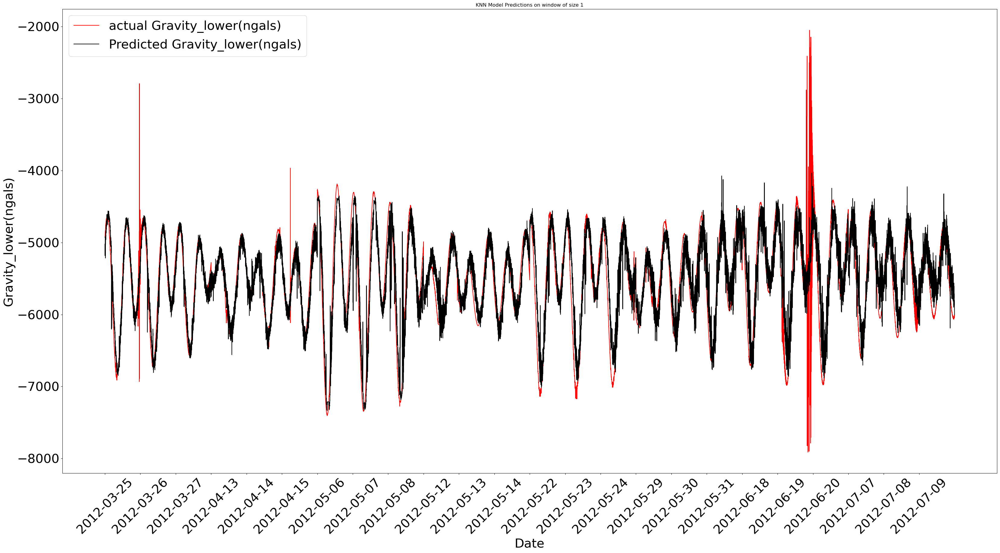

In [17]:
knn_W1 = KNeighborsRegressor(n_neighbors = 15, weights='distance', n_jobs = -1)
# apply_model_10by10CV(X_train_S1W1, X_test_S1W1, y_train_S1W1, y_test_S1W1, knn_S1W1)
knn_W1.fit(X_train_W1, y_train_W1)

y_pred_knn_W1 = knn_W1.predict(np.array(X_test_W1))

get_performance(y_test_W1.astype(float), y_pred_knn_W1.astype(float))
prediction_plot(y_test_W1, y_pred_knn_W1, test_sample_dates_W1, "KNN", 1)

/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(
/home/raghav/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_4235/1272365622.py:10: RuntimeWarning: invalid value encountered in log
  LOG_e = np.square(np.log(actual+1)-np.log(pred+1))


RMSE value:  309.97183213045975
RMSLE value:  nan
MAPE value:  0.042003195818860084
percentage bias:  -0.757615588407572


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


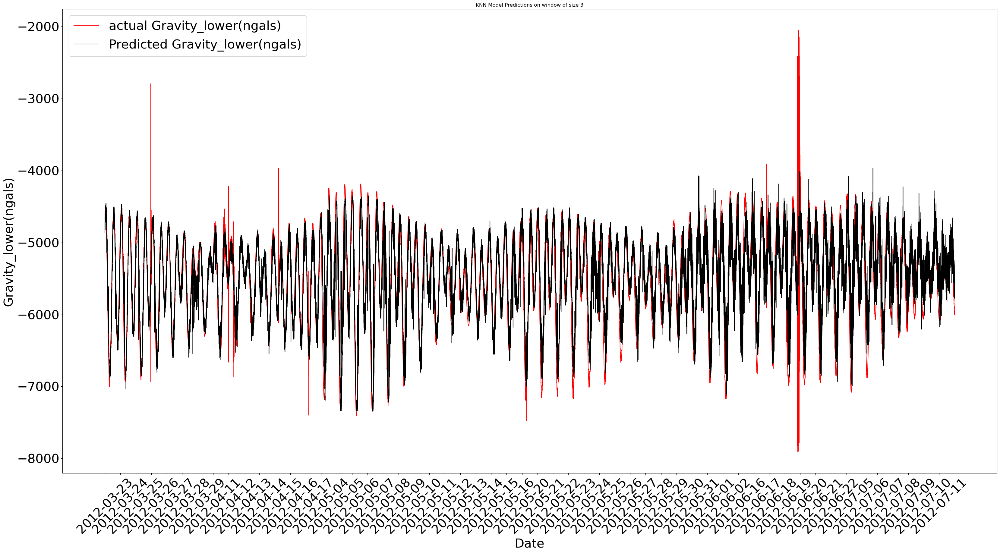

In [18]:
knn_W3 = KNeighborsRegressor(n_neighbors = 15, weights='distance', n_jobs = -1)
# apply_model_10by10CV(X_train_S1W1, X_test_S1W1, y_train_S1W1, y_test_S1W1, knn_S1W1)
knn_W3.fit(X_train_W3, y_train_W3)

y_pred_knn_W3 = knn_W3.predict(np.array(X_test_W3))

get_performance(y_test_W3.astype(float), y_pred_knn_W3.astype(float))
prediction_plot(y_test_W3, y_pred_knn_W3, test_sample_dates_W3, "KNN", 3)

In [23]:
# Load the model from the .pkl file
RF_W1_path = '/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/random_forest_on_gravity_data_W1.pkl'
RF_W3_path = '/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/random_forest_on_gravity_data_W3.pkl'
XGB_W1_path = '/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/XGBoost_on_gravity_data_W1.pkl'
XGB_W3_path = '/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/saved_models/XGBoost_on_gravity_data_W3.pkl'

# with open(RF_W1_path, 'rb') as file:
#     RF_W1 = pickle.load(file)
    
# with open(RF_W3_path, 'rb') as file:
#     RF_W3 = pickle.load(file)
    
# with open(XGB_W1_path, 'rb') as file:
#     XGB_W1 = pickle.load(file)
    
# with open(XGB_W3_path, 'rb') as file:
#     XGB_W3 = pickle.load(file)

RF_W1 = joblib.load(RF_W1_path)
RF_W3 = joblib.load(RF_W3_path)

XGB_W1 = joblib.load(XGB_W1_path)
XGB_W3 = joblib.load(XGB_W3_path)

In [24]:
y_pred_RF_W1 = RF_W1.predict(np.array(X_test_W1))
y_pred_RF_W3 = RF_W3.predict(np.array(X_test_W3))

y_pred_XGB_W1 = XGB_W1.predict(np.array(X_test_W1))
y_pred_XGB_W3 = XGB_W3.predict(np.array(X_test_W3))

/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done 300 out of 300 | elapsed:    0.1s finished
/home/raghav/anaconda3/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done 300 out of 300 | elapsed:    0.2s finished


In [25]:
y_pred_RF_W1.shape

(34560,)

In [26]:
y_test_W1.shape

(34560,)

In [31]:
def get_MSE_list(y_test, y_pred):
    result = []
    for actual, pred in zip(y_test, y_pred):
        result.append(MSE(actual, pred))
    return result

def get_RMSE_list(y_test, y_pred):
    result = []
    for actual, pred in zip(y_test, y_pred):
        result.append(RMSE(actual, pred))
    return result

In [33]:
KNN_W1_MSE = get_MSE_list(y_test_W1, y_pred_knn_W1)
KNN_W3_MSE = get_MSE_list(y_test_W3, y_pred_knn_W3)

RF_W1_MSE = get_MSE_list(y_test_W1, y_pred_RF_W1)
RF_W3_MSE = get_MSE_list(y_test_W3, y_pred_RF_W3)

XGB_W1_MSE = get_MSE_list(y_test_W1, y_pred_XGB_W1)
XGB_W3_MSE = get_MSE_list(y_test_W3, y_pred_XGB_W3)

In [ ]:
# def prediction_plot(y_true, y_pred, dates, model_name, w_size, per_day_samples = 1440):
#     plt.figure(figsize = (40,20))
#     plt.plot(np.array(y_true), color='red')
#     plt.plot(np.array(y_pred), color='black')
#     plt.xticks([i for i in range(0, len(dates.values), per_day_samples)], dates.dt.strftime('%Y-%m-%d').values[::per_day_samples], rotation=45, fontsize=30)

#     # # Label rotation for better readability, adjust as needed
#     # plt.xticks(rotation=45)

#     plt.yticks(fontsize=30)
#     plt.xlabel("Date", fontsize=30)
#     plt.ylabel("Gravity_lower(ngals)", fontsize=30)
#     plt.legend(['actual Gravity_lower(ngals)', 'Predicted Gravity_lower(ngals)'], fontsize=30)
#     plt.title("{} Model Predictions on window of size {}".format(model_name, w_size))
#     plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/model_output_plots/{model_name}_Window_{w_size}.pdf", format='pdf')
#     plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/model_output_plots/{model_name}_Window_{w_size}.eps", format='eps')
#     plt.show()

In [37]:
def get_MSE_plot(MSE_list, dates, model_name, w_size, per_day_samples = 1440):
    
    plt.figure(figsize = (40,20))
    plt.plot(np.array(MSE_list), color='red')
    
    plt.xticks([i for i in range(0, len(dates.values), per_day_samples)], dates.dt.strftime('%Y-%m-%d').values[::per_day_samples], rotation=45) #, fontsize=30)
#     plt.yticks(fontsize=30)

#     plt.xlabel("Date", fontsize=30)
#     plt.ylabel("MSE", fontsize=30)
#     plt.legend(["Prediction Error"], fontsize=30)
    plt.xlabel("Date")
    plt.ylabel("MSE")
    plt.legend(["Prediction Error"])
    plt.title("{} Presdiction errors on window of size {}".format(model_name, w_size))
    
    plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/model_output_plots/{model_name}_Window_{w_size}_MSE.pdf", format='pdf')
    plt.savefig(f"/home/raghav/Raghav/Personal/Gravity_data_experiment/outputs_on_new_cleaned_data/model_output_plots/{model_name}_Window_{w_size}_MSE.eps", format='eps')
    
    plt.show()

In [39]:
plt.rcParams.update({'font.size': 30})

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


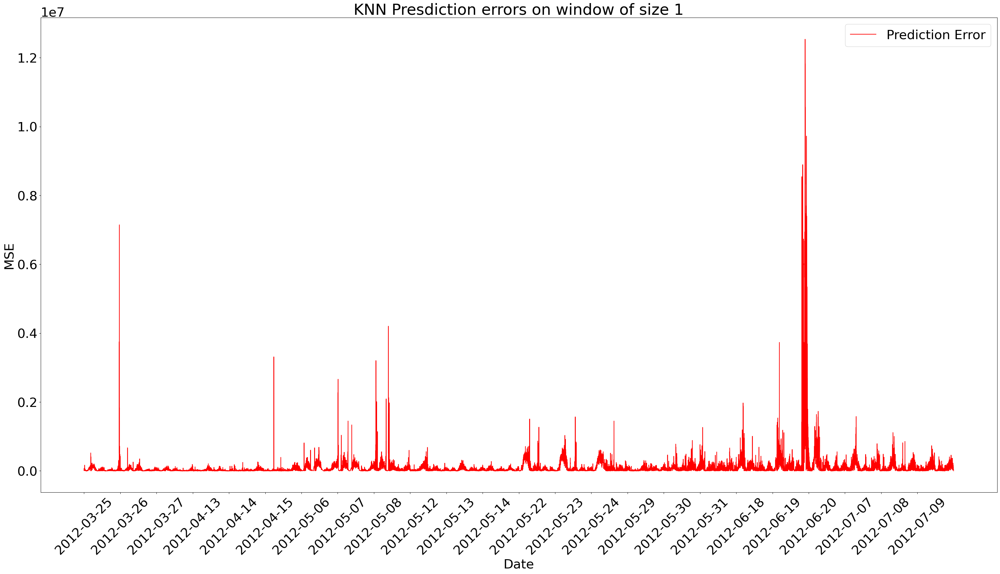

In [40]:
get_MSE_plot(KNN_W1_MSE, test_sample_dates_W1, "KNN", 1)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


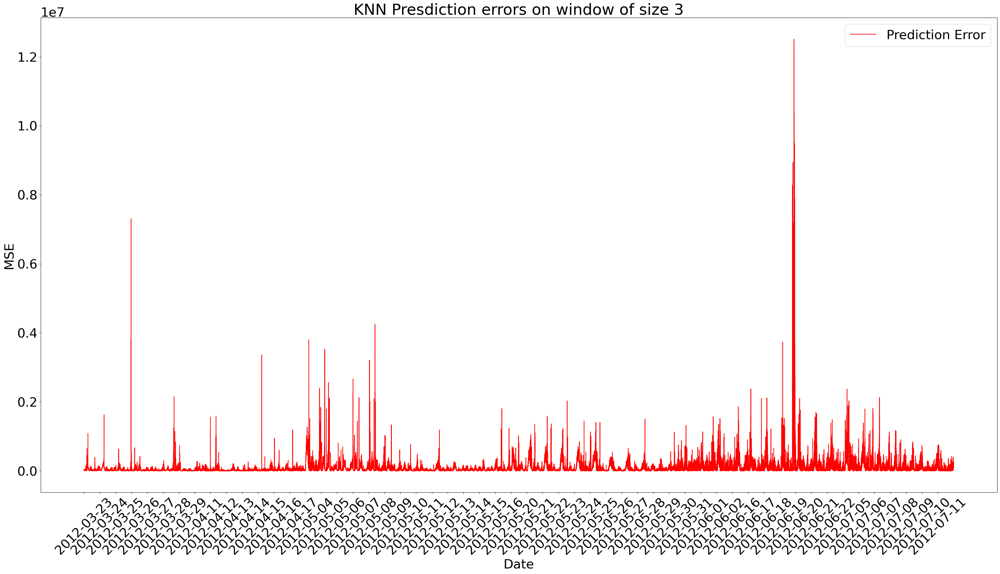

In [41]:
get_MSE_plot(KNN_W3_MSE, test_sample_dates_W3, "KNN", 3)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


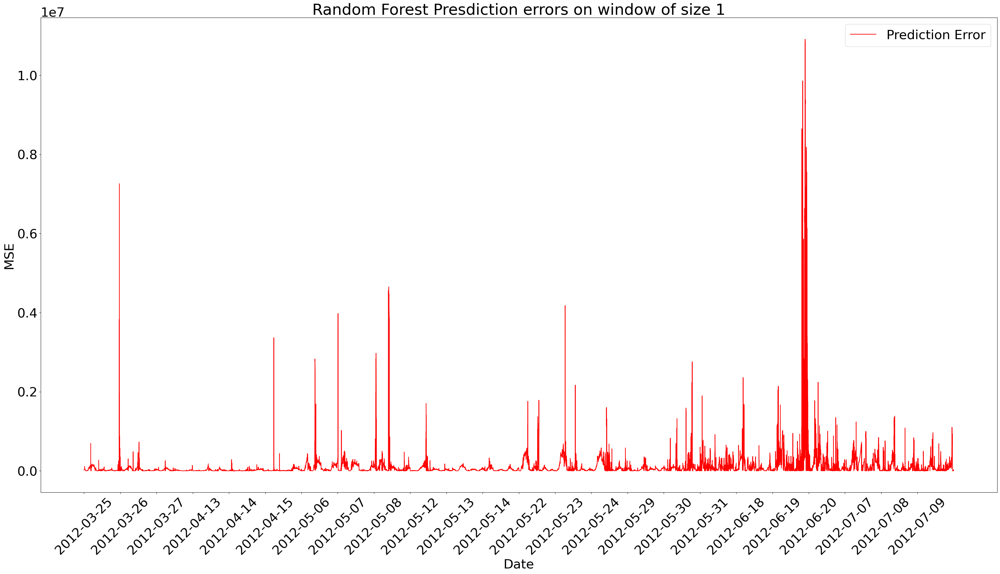

In [42]:
get_MSE_plot(RF_W1_MSE, test_sample_dates_W1, "Random Forest", 1)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


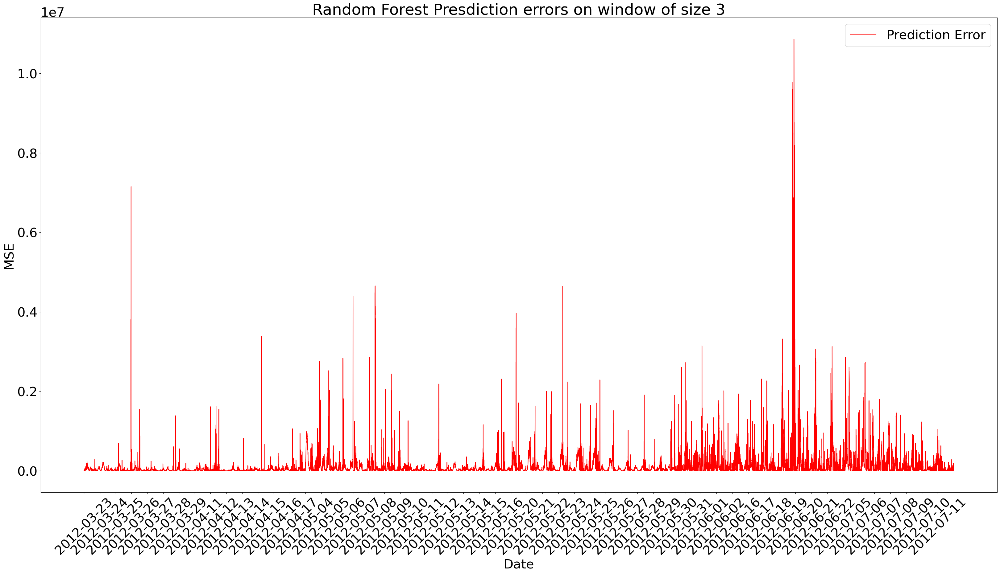

In [43]:
get_MSE_plot(RF_W3_MSE, test_sample_dates_W3, "Random Forest", 3)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


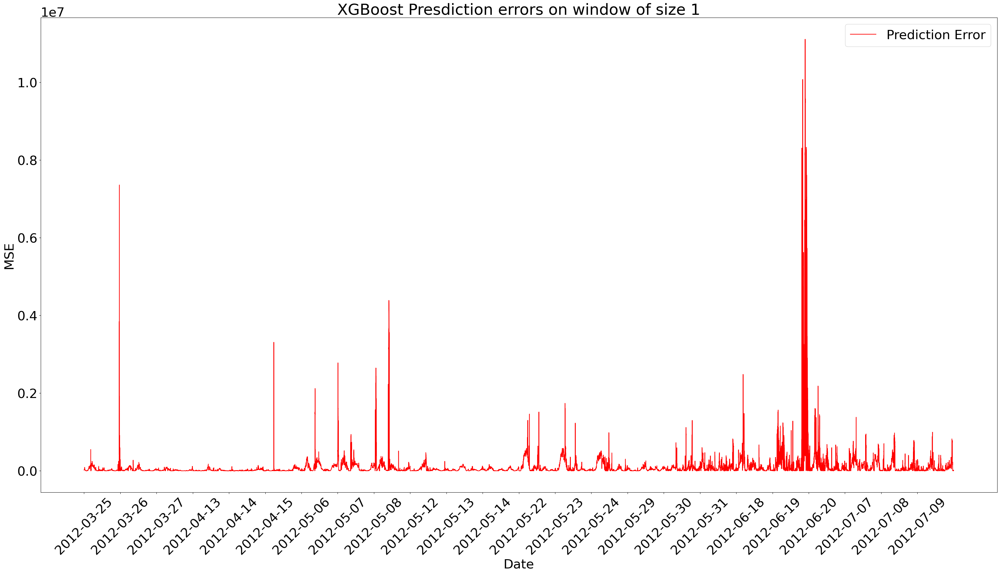

In [44]:
get_MSE_plot(XGB_W1_MSE, test_sample_dates_W1, "XGBoost", 1)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


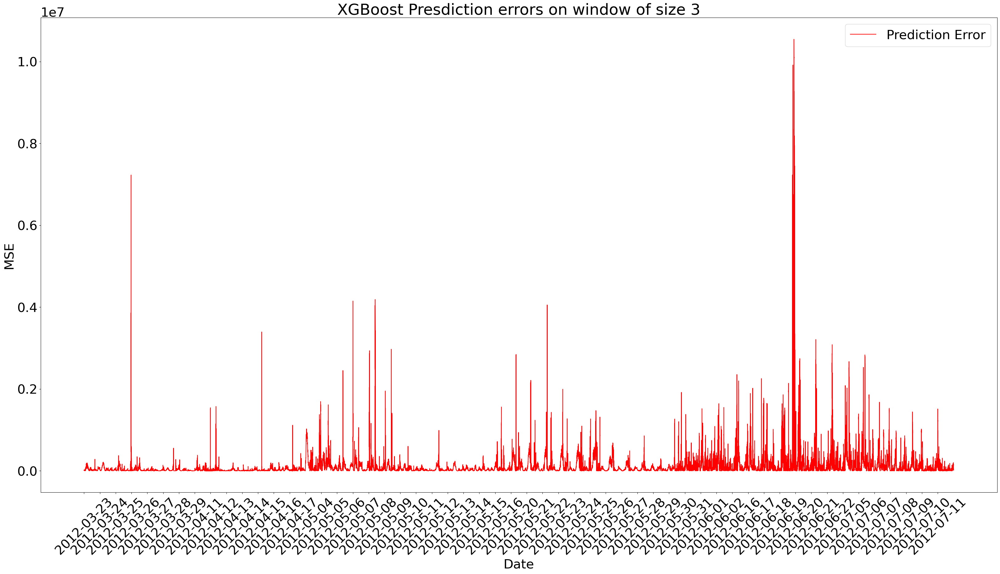

In [45]:
get_MSE_plot(XGB_W3_MSE, test_sample_dates_W3, "XGBoost", 3)